In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from numpy.linalg import inv
import seaborn as sns
%matplotlib inline
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [2]:
df= pd.read_csv('Case_2_Dataset.csv')

In [3]:
df.head(5)

,Area,Perimeter,MajorAxisLength,DFactor1,DFactor2,DFactor3,DFactor4,DFactor5,DFactor6,DFactor7,DFactor8,DFactor9,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SE
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SE
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SE
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SE
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SE


In [5]:
classes = df['Class'].unique()
print("Unique classes:", classes)

Unique classes: ['SE' 'BA' 'BO' 'CA' 'HO' 'SI' 'DE']


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   DFactor1         13611 non-null  float64
 4   DFactor2         13611 non-null  float64
 5   DFactor3         13611 non-null  float64
 6   DFactor4         13611 non-null  int64  
 7   DFactor5         13611 non-null  float64
 8   DFactor6         13611 non-null  float64
 9   DFactor7         13611 non-null  float64
 10  DFactor8         13611 non-null  float64
 11  DFactor9         13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [6]:
df.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
DFactor1           0
DFactor2           0
DFactor3           0
DFactor4           0
DFactor5           0
DFactor6           0
DFactor7           0
DFactor8           0
DFactor9           0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

In [4]:
df.shape

(13611, 17)

In [4]:
import numpy as np
df = df.drop_duplicates()
df.drop_duplicates(inplace=True)
df.shape

(13543, 17)

In [8]:
df.describe()

,Area,Perimeter,MajorAxisLength,DFactor1,DFactor2,DFactor3,DFactor4,DFactor5,DFactor6,DFactor7,DFactor8,DFactor9,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000
mean,53048.460385,854.993406,319.895602,202.365321,1.581075,0.750315,53767.986709,253.034094,0.749829,0.987152,0.873671,0.800352,0.006561,0.001719,0.644341,0.995078
std,29392.438324,214.722684,85.809260,45.051632,0.245245,0.091858,29844.248525,59.307709,0.048939,0.004650,0.059393,0.061464,0.001130,0.000595,0.098653,0.004347
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36282.500000,703.230000,253.086806,175.886357,1.430662,0.715144,36673.000000,214.933277,0.718735,0.985678,0.833410,0.763228,0.005893,0.001158,0.582517,0.993720
50%,44580.000000,793.896000,296.404589,192.491117,1.549860,0.763997,45122.000000,238.245711,0.759903,0.988288,0.883490,0.801514,0.006643,0.001700,0.642424,0.996393
75%,61382.000000,977.146500,376.312489,217.245403,1.703916,0.809671,62360.000000,279.560351,0.786849,0.990019,0.917031,0.834470,0.007270,0.002173,0.696341,0.997891
max,254616.000000,1985.370000,738.860154,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


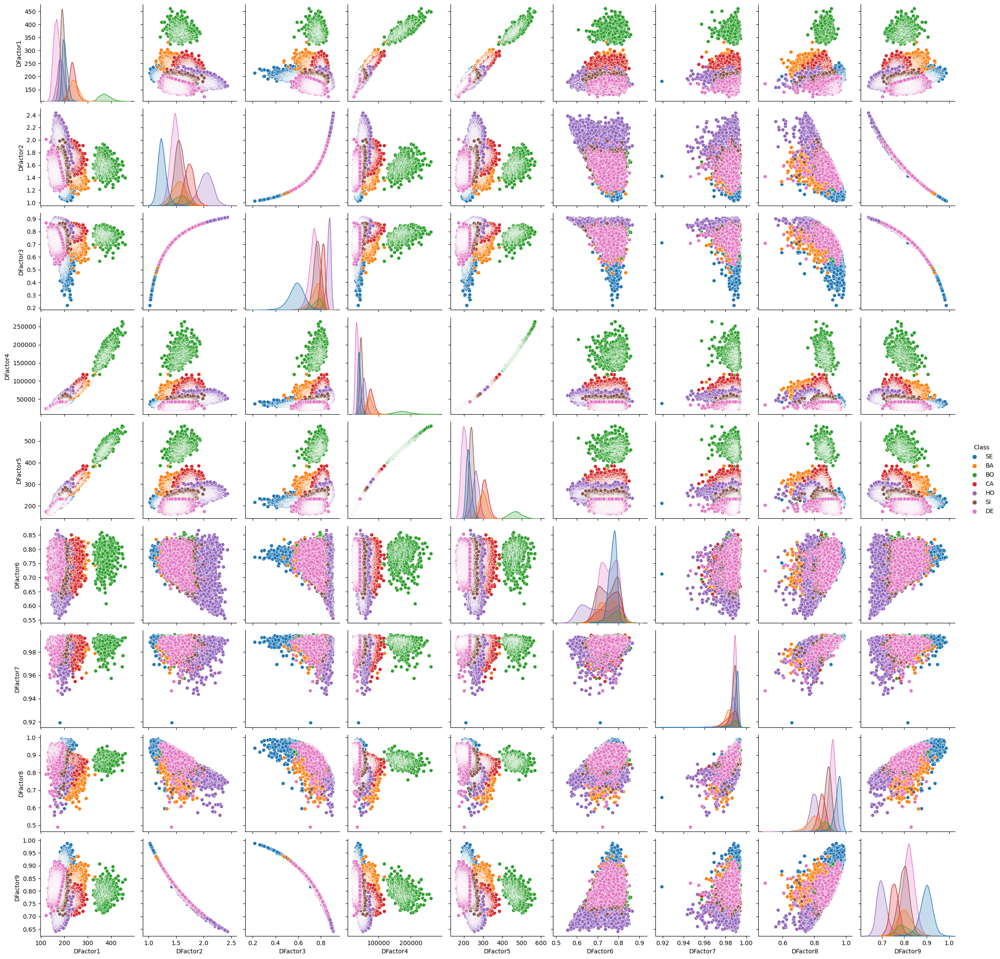

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(df, hue='Class', vars=[ 'DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor5', 'DFactor6', 'DFactor7', 'DFactor8', 'DFactor9'])
plt.savefig('pairplotDF.png')
plt.show()

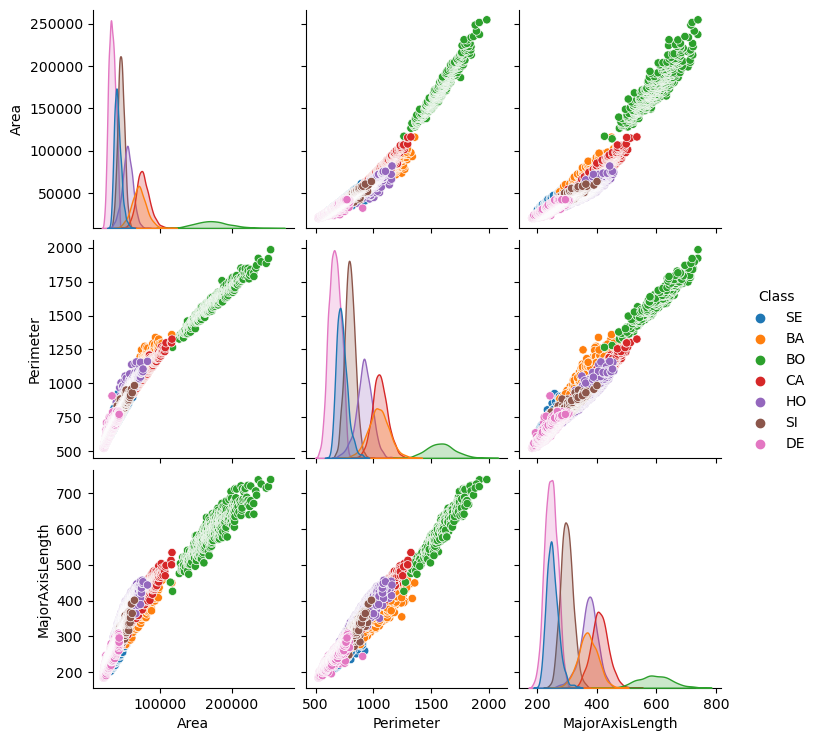

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(df, hue='Class', vars=[ 'Area', 'Perimeter', 'MajorAxisLength'])
plt.savefig('pairplototh.png')
plt.show()

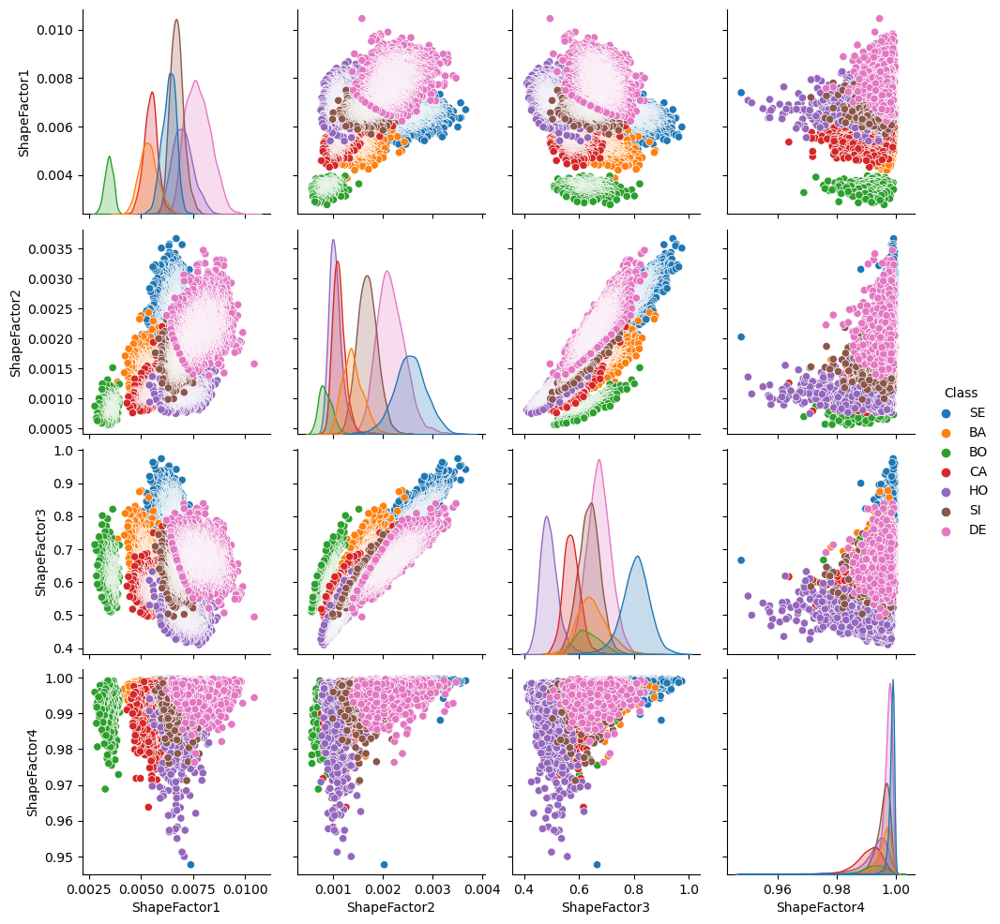

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(df, hue='Class', vars=[ 'ShapeFactor1', 'ShapeFactor2', 'ShapeFactor3','ShapeFactor4'])
plt.savefig('pairplotSha.png')
plt.show()

array([[<Axes: title={'center': 'DFactor1'}>,
        <Axes: title={'center': 'DFactor2'}>,
        <Axes: title={'center': 'DFactor3'}>],
       [<Axes: title={'center': 'DFactor4'}>,
        <Axes: title={'center': 'DFactor5'}>,
        <Axes: title={'center': 'DFactor6'}>],
       [<Axes: title={'center': 'DFactor7'}>,
        <Axes: title={'center': 'DFactor8'}>,
        <Axes: title={'center': 'DFactor9'}>]], dtype=object)

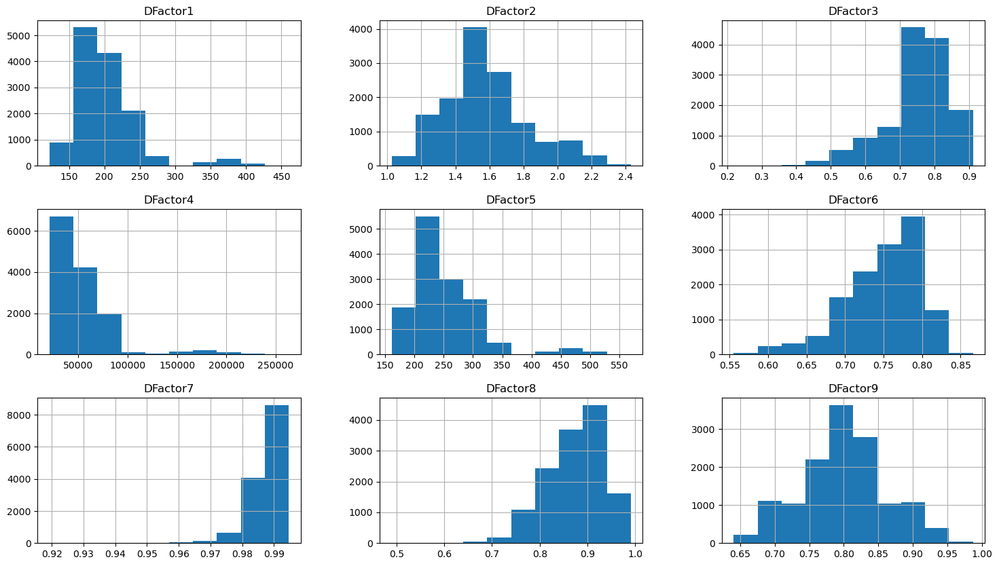

In [13]:
df.hist(['DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor5', 'DFactor6', 'DFactor7', 'DFactor8', 'DFactor9'], figsize=(18,10))

array([[<Axes: title={'center': 'Area'}>,
        <Axes: title={'center': 'Perimeter'}>],
       [<Axes: title={'center': 'MajorAxisLength'}>, <Axes: >]],
      dtype=object)

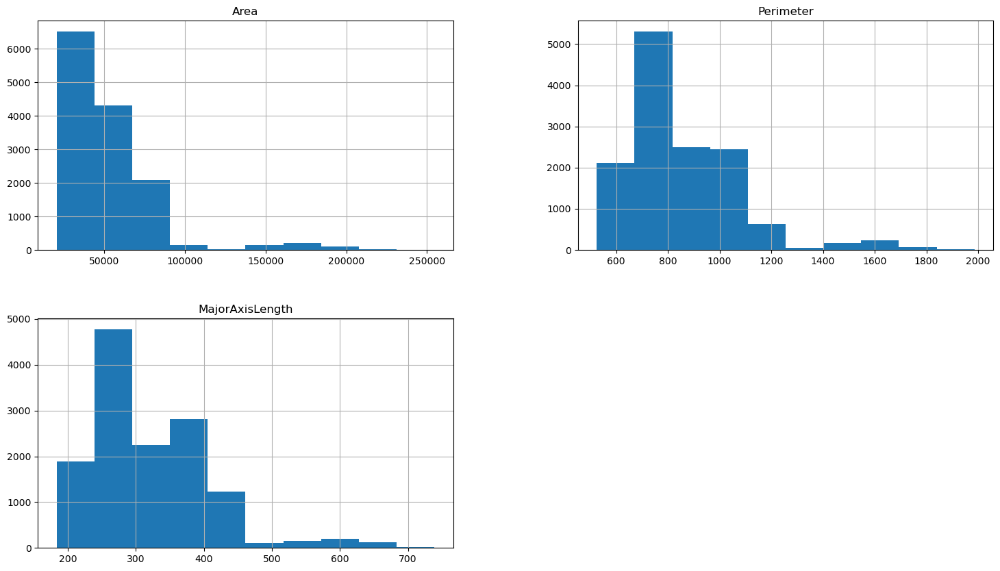

In [14]:
df.hist(['Area', 'Perimeter', 'MajorAxisLength'], figsize=(18,10))

array([[<Axes: title={'center': 'ShapeFactor1'}>,
        <Axes: title={'center': 'ShapeFactor2'}>],
       [<Axes: title={'center': 'ShapeFactor3'}>,
        <Axes: title={'center': 'ShapeFactor4'}>]], dtype=object)

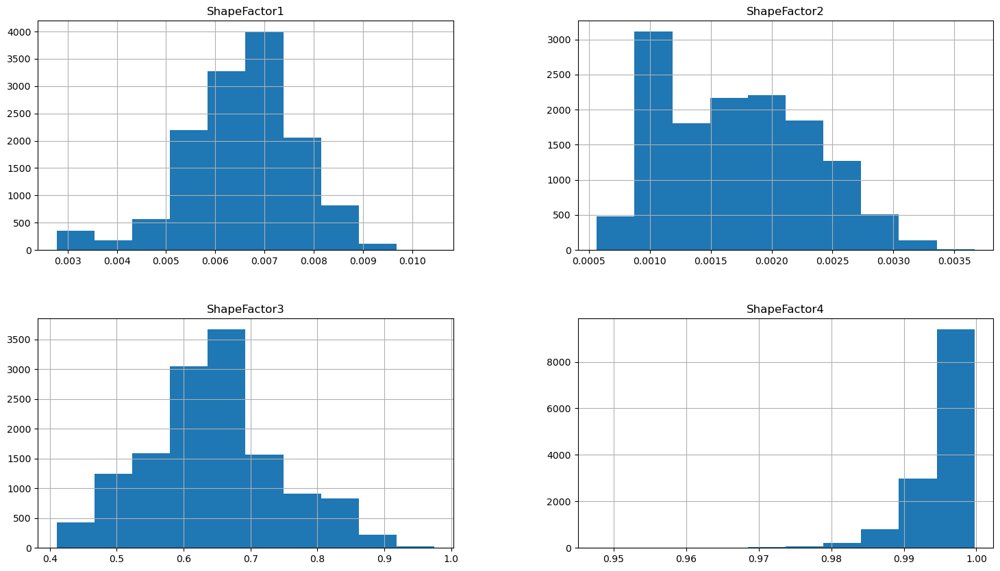

In [15]:
df.hist([ 'ShapeFactor1', 'ShapeFactor2', 'ShapeFactor3','ShapeFactor4'], figsize=(18,10))

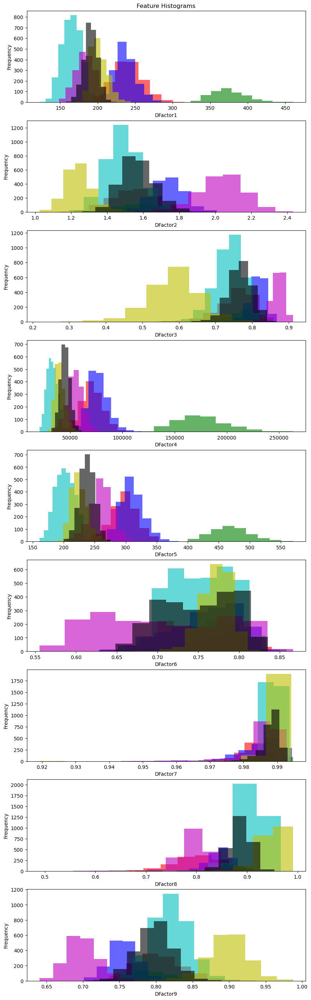

In [16]:
features = ['DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor5', 'DFactor6', 'DFactor7', 'DFactor8', 'DFactor9']
grouped = df.groupby('Class')

# Create subplots with three rows, one for each feature
fig, axes = plt.subplots(nrows=len(features), ncols=1, figsize=(10, 35))

# Set different colors for each class
colors = ['r', 'g', 'b', 'c', 'm', 'y', 'k']

# Iterate over features
for i, feature in enumerate(features):
    ax = axes[i]
    
    # Check if this is the top row of subplots
    if i == 0:
        ax.set_title("Feature Histograms")
    else:
        ax.set_title("")  # Clear title for other subplots
    
    # Iterate over all classes and plot histograms
    for (class_name, group), color in zip(grouped, colors):
        group[feature].plot(kind='hist', ax=ax, color=color, alpha=0.6)
    
    ax.set_xlabel(feature)
    
    # Check if a legend exists and remove it if present
    if ax.get_legend():
        ax.get_legend().remove()
plt.savefig('freq.png')
plt.show()


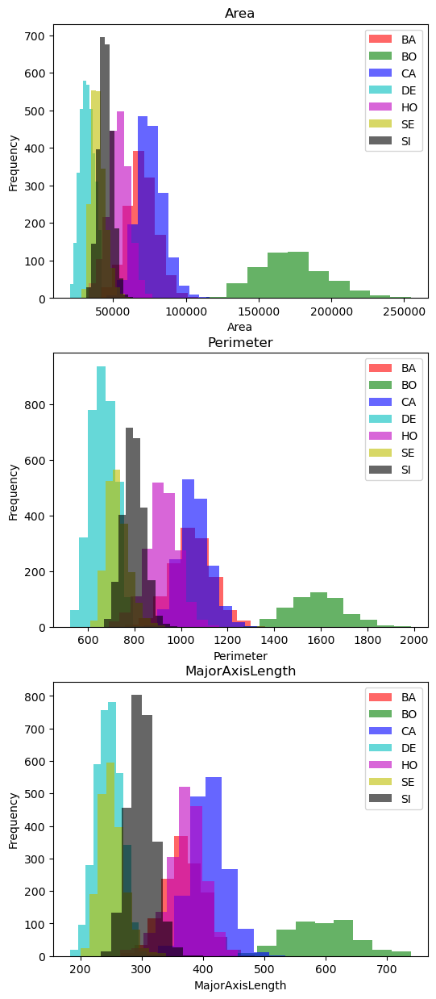

In [17]:
# Define the features you want to create histograms for
features = ['Area', 'Perimeter', 'MajorAxisLength']

# Create subplots with three rows, one for each feature
fig, axes = plt.subplots(nrows=len(features), ncols=1, figsize=(6, 15))

# Set different colors for each class
colors = ['r', 'g', 'b', 'c', 'm', 'y', 'k']

# Iterate over features
for i, feature in enumerate(features):
    ax = axes[i]
    ax.set_title(feature)
    
    # Iterate over all classes and plot histograms
    for (class_name, group), color in zip(grouped, colors):
        group[feature].plot(kind='hist', ax=ax, label=class_name, color=color, alpha=0.6)
    
    ax.set_xlabel(feature)
    ax.legend()
plt.savefig('freqaother.png')
plt.show()

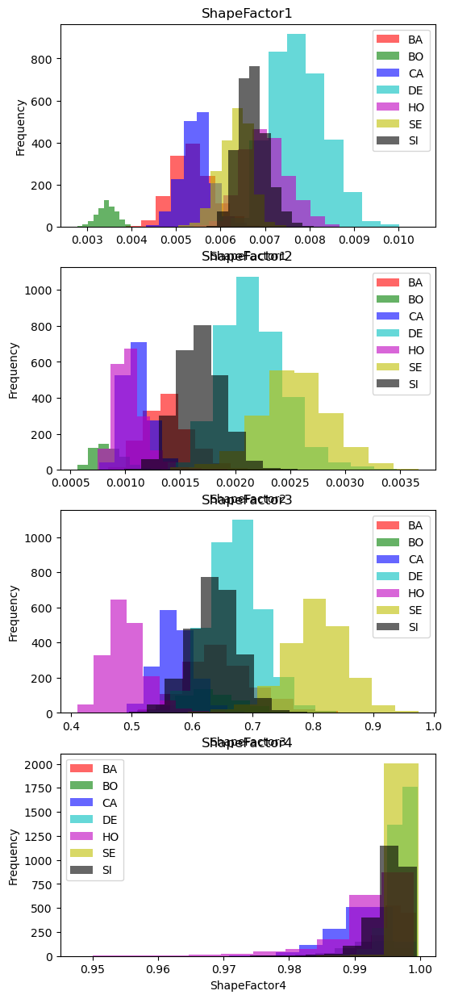

In [18]:
# Define the features you want to create histograms for
features = [ 'ShapeFactor1', 'ShapeFactor2', 'ShapeFactor3','ShapeFactor4']

# Create subplots with three rows, one for each feature
fig, axes = plt.subplots(nrows=len(features), ncols=1, figsize=(6, 15))

# Set different colors for each class
colors = ['r', 'g', 'b', 'c', 'm', 'y', 'k']

# Iterate over features
for i, feature in enumerate(features):
    ax = axes[i]
    ax.set_title(feature)
    
    # Iterate over all classes and plot histograms
    for (class_name, group), color in zip(grouped, colors):
        group[feature].plot(kind='hist', ax=ax, label=class_name, color=color, alpha=0.6)
    
    ax.set_xlabel(feature)
    ax.legend()
plt.savefig('freqshape.png')
plt.show()

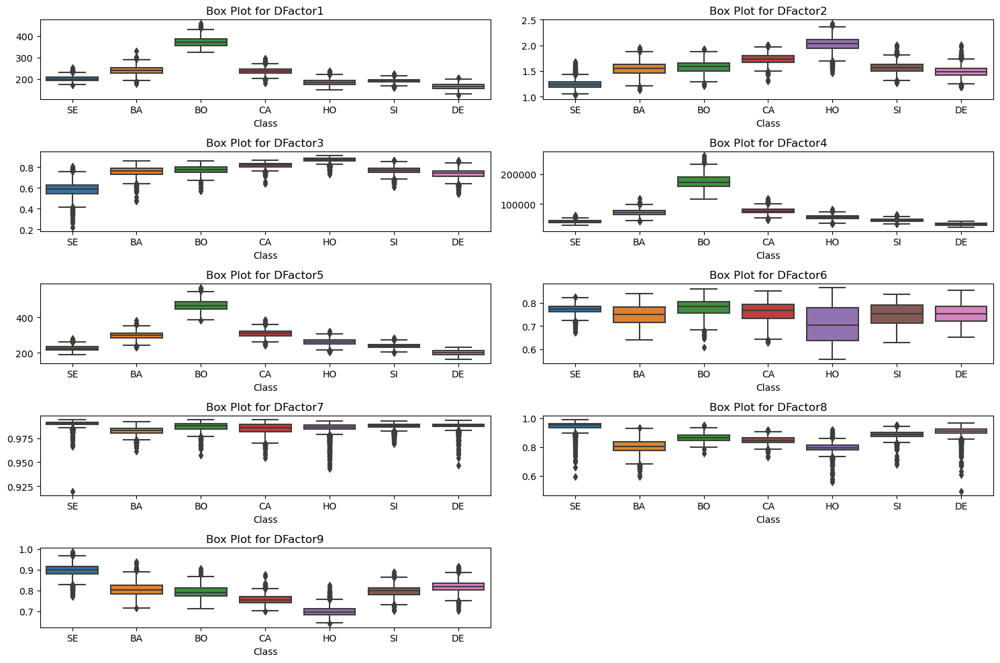

In [4]:
# Define the list of features you want to create box plots for
features = ['DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor5', 'DFactor6', 'DFactor7', 'DFactor8', 'DFactor9']

# Calculate the number of rows needed based on the number of features (2 features per row)
num_rows = len(features) // 2 + (len(features) % 2)  # Add 1 row if there's an odd number of features

# Create subplots with the calculated number of rows
fig, axes = plt.subplots(nrows=num_rows, ncols=2, figsize=(15, 10))

# Iterate over features and create box-and-whisker plots, arranging them in pairs in different rows
for i, feature in enumerate(features):
    row = i // 2
    col = i % 2
    ax = axes[row, col]
    sns.boxplot(x='Class', y=feature, data=df, ax=ax)
    ax.set_title(f'Box Plot for {feature}')
    ax.set_ylabel('')
    ax.set_xlabel('Class')

# Remove any empty subplots
for i in range(len(features), num_rows * 2):
    fig.delaxes(axes[i // 2, i % 2])

# Adjust the layout
plt.tight_layout()
plt.savefig('outdf.png')
plt.show()



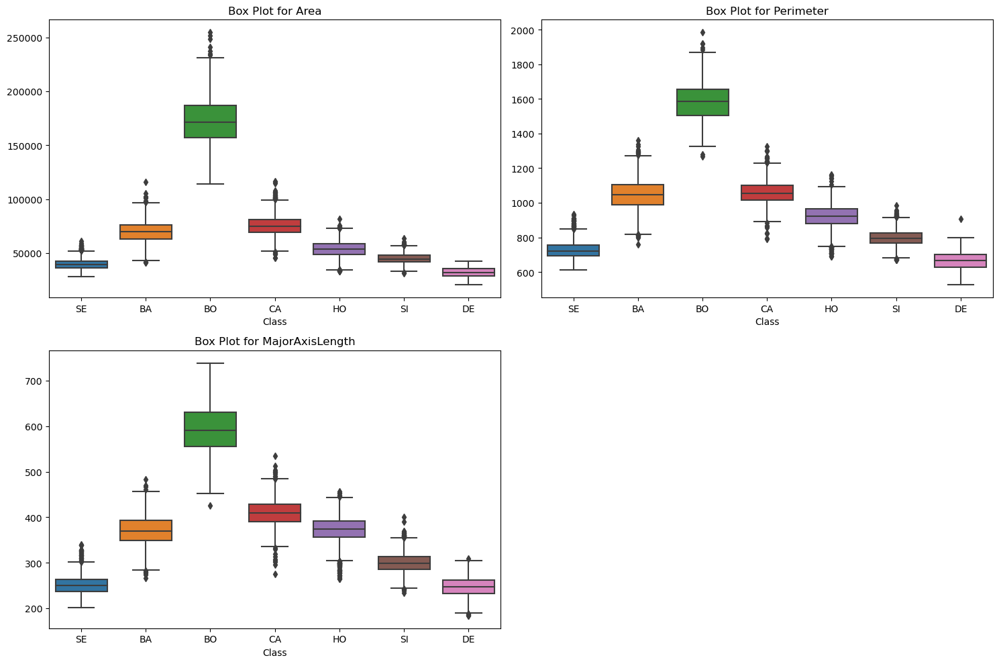

In [20]:
# Define the list of features you want to create box plots for
features = ['Area', 'Perimeter', 'MajorAxisLength']
# Calculate the number of rows needed based on the number of features (2 features per row)
num_rows = len(features) // 2 + (len(features) % 2)  # Add 1 row if there's an odd number of features

# Create subplots with the calculated number of rows
fig, axes = plt.subplots(nrows=num_rows, ncols=2, figsize=(15, 10))

# Iterate over features and create box-and-whisker plots, arranging them in pairs in different rows
for i, feature in enumerate(features):
    row = i // 2
    col = i % 2
    ax = axes[row, col]
    sns.boxplot(x='Class', y=feature, data=df, ax=ax)
    ax.set_title(f'Box Plot for {feature}')
    ax.set_ylabel('')
    ax.set_xlabel('Class')

# Remove any empty subplots
for i in range(len(features), num_rows * 2):
    fig.delaxes(axes[i // 2, i % 2])

# Adjust the layout
plt.tight_layout()
plt.savefig('outA.png')
plt.show()

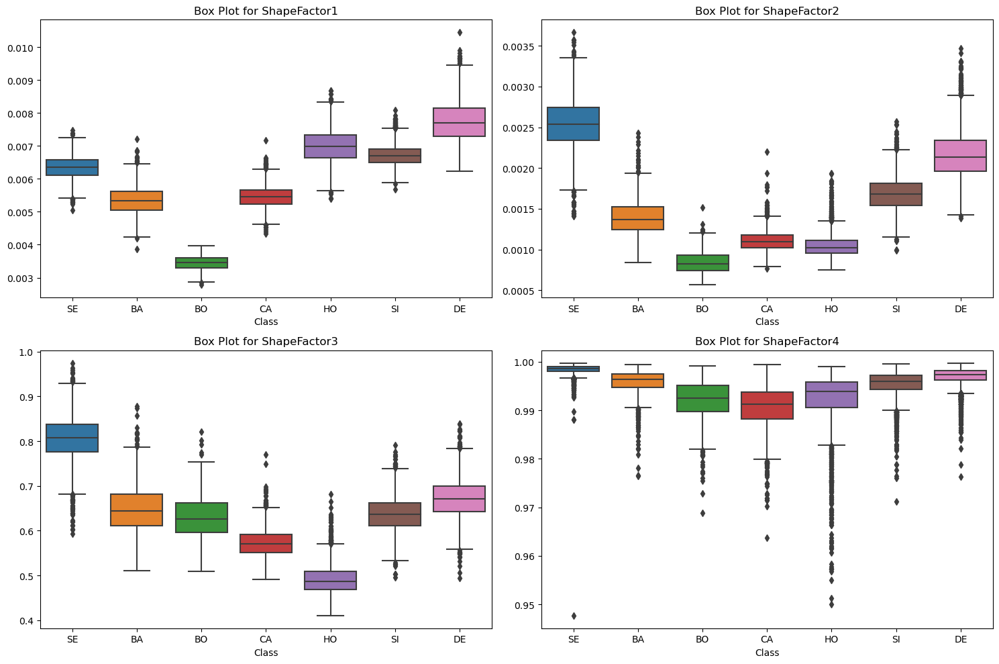

In [21]:
# Define the list of features you want to create box plots for
features = [ 'ShapeFactor1', 'ShapeFactor2', 'ShapeFactor3','ShapeFactor4']
# Calculate the number of rows needed based on the number of features (2 features per row)
num_rows = len(features) // 2 + (len(features) % 2)  # Add 1 row if there's an odd number of features

# Create subplots with the calculated number of rows
fig, axes = plt.subplots(nrows=num_rows, ncols=2, figsize=(15, 10))

# Iterate over features and create box-and-whisker plots, arranging them in pairs in different rows
for i, feature in enumerate(features):
    row = i // 2
    col = i % 2
    ax = axes[row, col]
    sns.boxplot(x='Class', y=feature, data=df, ax=ax)
    ax.set_title(f'Box Plot for {feature}')
    ax.set_ylabel('')
    ax.set_xlabel('Class')

# Remove any empty subplots
for i in range(len(features), num_rows * 2):
    fig.delaxes(axes[i // 2, i % 2])

# Adjust the layout
plt.tight_layout()
plt.savefig('outsh.png')
plt.show()

In [9]:
df.shape

(13543, 17)

In [10]:
# Define the columns want to check for outliers
columns_to_check = ['Area', 'Perimeter', 'MajorAxisLength', 'DFactor1', 'DFactor2',
       'DFactor3', 'DFactor4', 'DFactor5', 'DFactor7', 'DFactor6','DFactor8',
       'DFactor9', 'ShapeFactor1', 'ShapeFactor2', 'ShapeFactor3',
       'ShapeFactor4']
# Define the remove_outliers function
def remove_outliers(data, columns):
    data_no_outliers = data.copy()
    for column in columns:
        Q1 = data[column].quantile(0.25)
        Q3 = data[column].quantile(0.75)
        IQR = Q3 - Q1

        # Adjust this multiplier to control the outlier range
        IQR_multiplier = 1.5

        lower_bound = Q1 - IQR_multiplier * IQR
        upper_bound = Q3 + IQR_multiplier * IQR

        # Filter and remove outliers for the current column
        data_no_outliers = data_no_outliers[(data_no_outliers[column] >= lower_bound) &
                                            (data_no_outliers[column] <= upper_bound)]

    return data_no_outliers

# Remove outliers from specific columns
df_no_outliers = remove_outliers(df, columns_to_check)

# Optional: Save the cleaned dataset
df_no_outliers.to_csv('3rdversion_nooutliers_Final.csv', index=False)

In [24]:
df_no_outliers.shape

(10539, 17)

In [8]:
df.shape

(13611, 17)

In [5]:
# Define a function to impute outliers with the mean
def impute_outliers_with_mean(series):
    mean = series.mean()
    std = series.std()
    lower_bound = mean - 3 * std
    upper_bound = mean + 3 * std
    series = series.apply(lambda x: x if lower_bound <= x <= upper_bound else mean)
    return series

# Columns to impute outliers
columns_to_impute = ["Area", "Perimeter", "MajorAxisLength", "DFactor1", "DFactor2", "DFactor3",
                     "DFactor4", "DFactor5", "DFactor6", "DFactor7", "DFactor8", "DFactor9",
                     "ShapeFactor1", "ShapeFactor2", "ShapeFactor3", "ShapeFactor4"]

# Impute outliers for the specified columns
for col in columns_to_impute:
    df[col] = impute_outliers_with_mean(df[col])

# Save the new DataFrame with imputed outliers to a new CSV file
output_file = "df-impute_outliers03.csv"
df.to_csv(output_file, index=False)

print(f"Data with imputed outliers saved to {output_file}")


Data with imputed outliers saved to df-impute_outliers03.csv


In [6]:
df_impute_outliers= pd.read_csv('df-impute_outliers03.csv')

In [7]:
df_impute_outliers.shape

(13543, 17)

## Removing Redundant features by analyzing their correlation with other features and Targer variable:

- Correlation of different features and target variable

In [18]:
from scipy.stats import f_oneway, kruskal
df_impute_outliers['Class'] = df_impute_outliers['Class'].astype('category').cat.codes

# Group your data by the target variable
grouped_data = [df_impute_outliers[df_impute_outliers['Class'] == category] for category in df_impute_outliers['Class'].unique()]

# Create a dictionary to map class indices to class names
class_names = {0: 'SE', 1: 'BA', 2: 'BO', 3: 'CA', 4: 'HO', 5: 'SI', 6: 'DE'}

# Perform ANOVA or Kruskal-Wallis test for each feature
features = ['Area', 'Perimeter', 'MajorAxisLength', 'DFactor1', 'DFactor2',
       'DFactor3', 'DFactor4', 'DFactor5', 'DFactor6', 'DFactor7', 'DFactor8',
       'DFactor9', 'ShapeFactor1', 'ShapeFactor2', 'ShapeFactor3',
       'ShapeFactor4']

for feature in features:
    print(f"Feature: {feature}")
    for category, group in zip(df_impute_outliers['Class'].unique(), grouped_data):
        values = group[feature]
        if len(df['Class'].unique()) > 2:
            # Use Kruskal-Wallis test for non-parametric data
            stat, p_value = kruskal(*[values for values in grouped_data])
        else:
            # Use ANOVA for parametric data
            stat, p_value = f_oneway(*[values for values in grouped_data])
        
        # Convert the p-value from an array to a scalar and then format it
        p_value_scalar = p_value[0]  # Assuming p_value is a 1-element numpy array
        class_name = class_names[category]
        print(f"{class_name}: p-value = {p_value_scalar:.4f}")


Feature: Area
SI: p-value = 0.0000
SE: p-value = 0.0000
BA: p-value = 0.0000
BO: p-value = 0.0000
HO: p-value = 0.0000
DE: p-value = 0.0000
CA: p-value = 0.0000
Feature: Perimeter
SI: p-value = 0.0000
SE: p-value = 0.0000
BA: p-value = 0.0000
BO: p-value = 0.0000
HO: p-value = 0.0000
DE: p-value = 0.0000
CA: p-value = 0.0000
Feature: MajorAxisLength
SI: p-value = 0.0000
SE: p-value = 0.0000
BA: p-value = 0.0000
BO: p-value = 0.0000
HO: p-value = 0.0000
DE: p-value = 0.0000
CA: p-value = 0.0000
Feature: DFactor1
SI: p-value = 0.0000
SE: p-value = 0.0000
BA: p-value = 0.0000
BO: p-value = 0.0000
HO: p-value = 0.0000
DE: p-value = 0.0000
CA: p-value = 0.0000
Feature: DFactor2
SI: p-value = 0.0000
SE: p-value = 0.0000
BA: p-value = 0.0000
BO: p-value = 0.0000
HO: p-value = 0.0000
DE: p-value = 0.0000
CA: p-value = 0.0000
Feature: DFactor3
SI: p-value = 0.0000
SE: p-value = 0.0000
BA: p-value = 0.0000
BO: p-value = 0.0000
HO: p-value = 0.0000
DE: p-value = 0.0000
CA: p-value = 0.0000
Featur

- Correlation between different features

In [19]:
# Select the numerical features for which we want to calculate the correlation
numerical_features = ['Area', 'Perimeter', 'MajorAxisLength', 'DFactor1', 'DFactor2',
                      'DFactor3', 'DFactor4', 'DFactor5', 'DFactor6', 'DFactor7', 'DFactor8',
                      'DFactor9', 'ShapeFactor1', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4']

# Calculate the correlation matrix
correlation_matrix = df_impute_outliers[numerical_features].corr()

# Display the correlation matrix
print(correlation_matrix)

                     Area  Perimeter  MajorAxisLength  DFactor1  DFactor2  \
Area             1.000000   0.971304         0.920021  0.870650  0.430547   
Perimeter        0.971304   1.000000         0.956167  0.824915  0.522809   
MajorAxisLength  0.920021   0.956167         1.000000  0.681877  0.699795   
DFactor1         0.870650   0.824915         0.681877  1.000000  0.000600   
DFactor2         0.430547   0.522809         0.699795  0.000600  1.000000   
DFactor3         0.419200   0.498115         0.656201  0.015498  0.904834   
DFactor4         0.996921   0.972380         0.920084  0.870132  0.431718   
DFactor5         0.984401   0.984030         0.936089  0.880125  0.443424   
DFactor6        -0.041181  -0.089035        -0.123632  0.072941 -0.248075   
DFactor7        -0.323017  -0.377255        -0.336530 -0.202142 -0.278204   
DFactor8        -0.616036  -0.720587        -0.761801 -0.299519 -0.781380   
DFactor9        -0.444048  -0.532364        -0.707251 -0.008360 -0.982037   

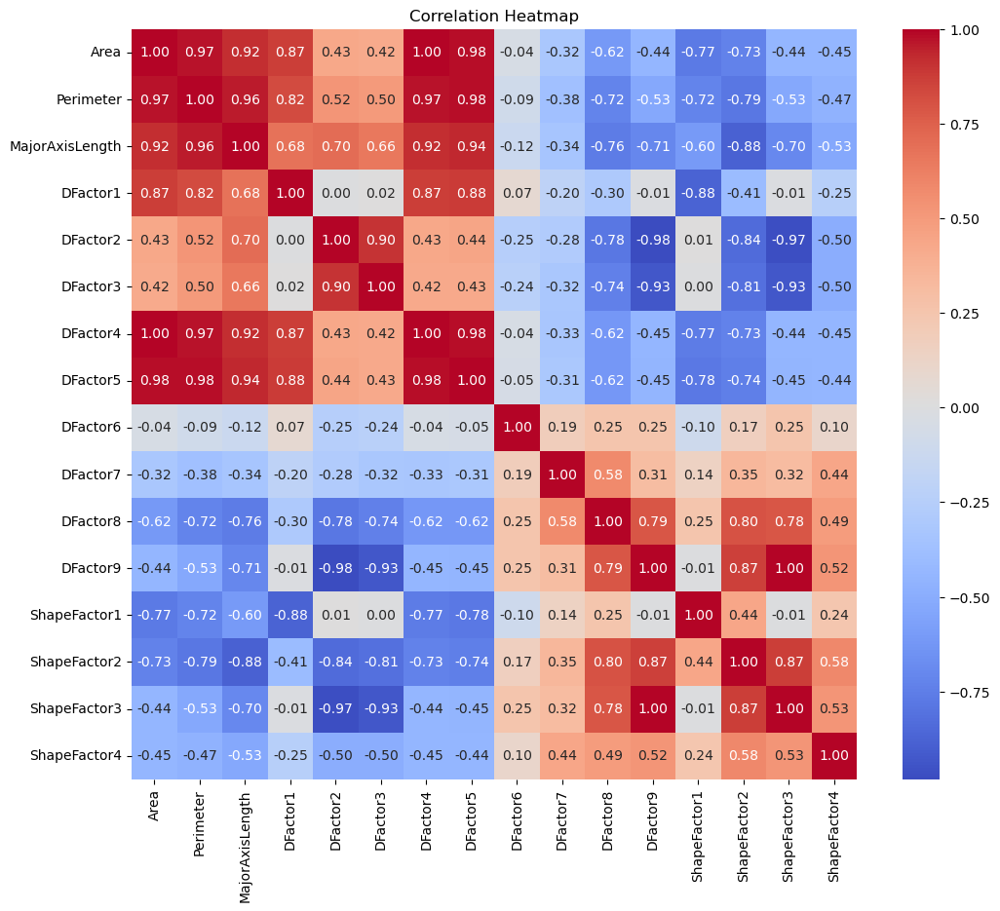

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt
correlation_matrix = df_impute_outliers[numerical_features].corr()
# Set the figure size to make the heatmap larger
plt.figure(figsize=(12, 10))

# Create a heatmap of the correlation matrix
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

# Customize the heatmap, if needed
plt.title("Correlation Heatmap")
plt.show()

In [8]:
SelectedColumns=['Area', 'DFactor1', 'DFactor2',
                      'DFactor3', 'DFactor4', 'DFactor6', 'DFactor7', 'DFactor8',
                      'DFactor9', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4','Class']

# Selecting final columns
DataForML=df_impute_outliers[SelectedColumns]
DataForML.head()

,Area,DFactor1,DFactor2,DFactor3,DFactor4,DFactor6,DFactor7,DFactor8,DFactor9,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395.0,173.888747,1.197191,0.549812,28715.0,0.763923,0.988856,0.958027,0.913358,0.003147,0.834222,0.998724,SE
1,28734.0,182.734419,1.097356,0.750315,29172.0,0.783968,0.984986,0.887034,0.953861,0.001719,0.909851,0.998430,SE
2,29380.0,175.931143,1.209713,0.562727,29690.0,0.778113,0.989559,0.947849,0.908774,0.003048,0.825871,0.999066,SE
3,30008.0,182.516516,1.153638,0.498616,30724.0,0.782681,0.976696,0.903936,0.928329,0.003215,0.861794,0.994199,SE
4,30140.0,190.279279,1.060798,0.750315,30417.0,0.773098,0.990893,0.984877,0.970516,0.001719,0.644341,0.999166,SE


In [9]:
DataForML.to_csv('FinalVer_imputeoutliersandcorrelation.csv', index=False)

In [10]:
DataForML.head(5)

,Area,DFactor1,DFactor2,DFactor3,DFactor4,DFactor6,DFactor7,DFactor8,DFactor9,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395.0,173.888747,1.197191,0.549812,28715.0,0.763923,0.988856,0.958027,0.913358,0.003147,0.834222,0.998724,SE
1,28734.0,182.734419,1.097356,0.750315,29172.0,0.783968,0.984986,0.887034,0.953861,0.001719,0.909851,0.998430,SE
2,29380.0,175.931143,1.209713,0.562727,29690.0,0.778113,0.989559,0.947849,0.908774,0.003048,0.825871,0.999066,SE
3,30008.0,182.516516,1.153638,0.498616,30724.0,0.782681,0.976696,0.903936,0.928329,0.003215,0.861794,0.994199,SE
4,30140.0,190.279279,1.060798,0.750315,30417.0,0.773098,0.990893,0.984877,0.970516,0.001719,0.644341,0.999166,SE


In [2]:
newdata=pd.read_csv('FinalVer_imputeoutliersandcorrelation.csv')
newdata.head(5)

,Area,DFactor1,DFactor2,DFactor3,DFactor4,DFactor6,DFactor7,DFactor8,DFactor9,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395.0,173.888747,1.197191,0.549812,28715.0,0.763923,0.988856,0.958027,0.913358,0.003147,0.834222,0.998724,SE
1,28734.0,182.734419,1.097356,0.750315,29172.0,0.783968,0.984986,0.887034,0.953861,0.001719,0.909851,0.998430,SE
2,29380.0,175.931143,1.209713,0.562727,29690.0,0.778113,0.989559,0.947849,0.908774,0.003048,0.825871,0.999066,SE
3,30008.0,182.516516,1.153638,0.498616,30724.0,0.782681,0.976696,0.903936,0.928329,0.003215,0.861794,0.994199,SE
4,30140.0,190.279279,1.060798,0.750315,30417.0,0.773098,0.990893,0.984877,0.970516,0.001719,0.644341,0.999166,SE


### Decision Tree
- Finding the best combination of parameters andd features

In [19]:
from itertools import combinations
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, f1_score

X = newdata[['Area','DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor6', 'DFactor7', 'DFactor8', 'DFactor9', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4']]
y = newdata['Class'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=428)

# Create lists of different feature sets (example combinations)
feature_sets = [
    ['DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor6', 'DFactor7', 'DFactor8', 'DFactor9'],
    ['Area','ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4'],
    ['ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4'],
    ['Area','DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor6', 'DFactor7', 'DFactor8', 'DFactor9'],
    ['DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor6', 'DFactor7', 'DFactor8', 'DFactor9','ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4','Area']
]

# Define a list of different hyperparameters to try
hyperparameters = [
    {'max_depth': 5, 'min_samples_split': 2},
    {'max_depth': 10, 'min_samples_split': 2},
    {'max_depth': 7, 'min_samples_split': 2},
    {'max_depth': 8, 'min_samples_split': 3},
    {'max_depth': 8, 'min_samples_split': 2}
]

best_model = None
best_feature_set = None
best_score = 0

# Iterate over feature sets
for features in feature_sets:
    X_train_subset = X_train[features]
    
    # Iterate over hyperparameters
    for params in hyperparameters:
        clf = DecisionTreeClassifier(**params)
        
        # Evaluate the model using cross-validation
        scores = cross_val_score(clf, X_train_subset, y_train, cv=5, scoring='accuracy')
        mean_score = scores.mean()
        
        if mean_score > best_score:
            best_score = mean_score
            best_model = clf
            best_feature_set = features

# Train the best model on the entire training set with the best feature set
best_model.fit(X_train[best_feature_set], y_train)

# Evaluate the model on the test set
y_pred = best_model.predict(X_test[best_feature_set])
test_accuracy = accuracy_score(y_test, y_pred)
test_f1_score = f1_score(y_test, y_pred, average='weighted')

print("Best feature set:", best_feature_set)
print("Best model hyperparameters:", best_model.get_params())
print("Test accuracy:", test_accuracy)
print("Test F1 score:", test_f1_score)


Best feature set: ['DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor6', 'DFactor7', 'DFactor8', 'DFactor9', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4', 'Area']
Best model hyperparameters: {'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': 10, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': None, 'splitter': 'best'}
Test accuracy: 0.9007013658176449
Test F1 score: 0.9005074441924412


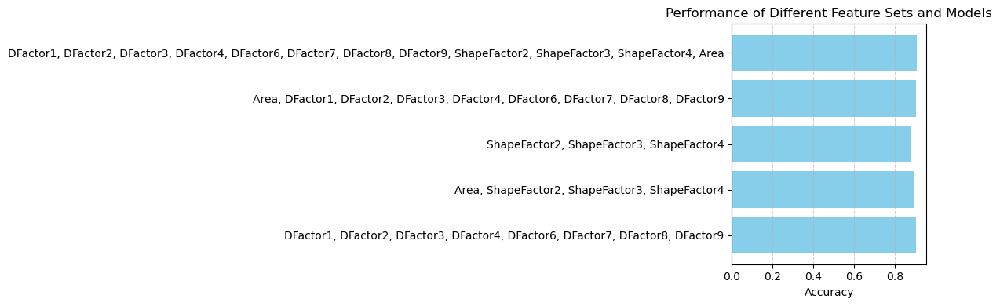

In [20]:
import matplotlib.pyplot as plt

# Define lists to store results
feature_set_names = []  # Names of feature sets
accuracy_scores = []    # Accuracy scores for each try

# Iterate over feature sets
for features in feature_sets:
    X_train_subset = X_train[features]
    
    # Iterate over hyperparameters
    for params in hyperparameters:
        clf = DecisionTreeClassifier(**params)
        
        # Evaluate the model using cross-validation (you can also use train_test_split)
        scores = cross_val_score(clf, X_train_subset, y_train, cv=5, scoring='accuracy')
        mean_score = scores.mean()
        
        # Store the results
        feature_set_names.append(', '.join(features))
        accuracy_scores.append(mean_score)

# Create a bar chart to visualize the results
plt.figure(figsize=(12, 4))
plt.barh(feature_set_names, accuracy_scores, color='skyblue')
plt.xlabel('Accuracy')
plt.title('Performance of Different Feature Sets and Models')
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()

# Show the plot
plt.show()

### Creating Validation Daset

In [21]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Select features and target variable
X = newdata[['DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor6', 'DFactor7', 'DFactor8',
             'DFactor9', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4', 'Area']]
y = newdata['Class']

# Split the data into a training set, a test set, and a validation set
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Scale the data using StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
X_val = scaler.transform(X_val)

# Create a Decision Tree classifier
clf = DecisionTreeClassifier(max_depth=8)

# Fit the classifier to the training data
clf.fit(X_train, y_train)

# Make predictions on the test set
y_test_pred = clf.predict(X_test)

# Make predictions on the validation set
y_val_pred = clf.predict(X_val)

# Evaluate the model on the test set and validation set
test_accuracy = accuracy_score(y_test, y_test_pred)
val_accuracy = accuracy_score(y_val, y_val_pred)

print(f"Test Set Accuracy: {test_accuracy:.2f}")
print(f"Validation Set Accuracy: {val_accuracy:.2f}")


Test Set Accuracy: 0.90
Validation Set Accuracy: 0.90


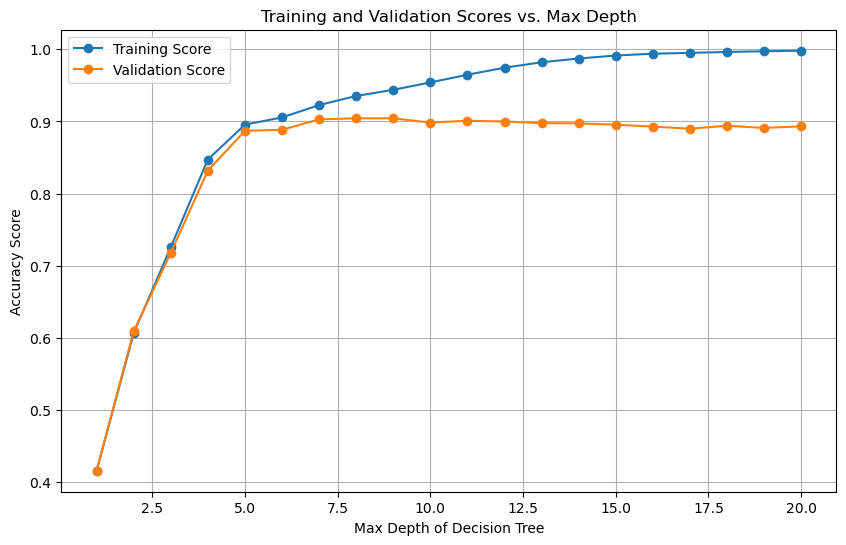

In [15]:
from sklearn.metrics import accuracy_score
max_depths = np.arange(1, 21)  # Adjust the range as needed

# Lists to store training and validation scores
train_scores = []
val_scores = []

# Split the data into a training set and a validation set
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Iterate over different tree depths
for depth in max_depths:
    # Create a Decision Tree classifier with the specified depth
    clf = DecisionTreeClassifier(max_depth=depth, random_state=42)
    
    # Fit the classifier to the training data
    clf.fit(X_train, y_train)
    
    # Make predictions on the training and validation sets
    y_train_pred = clf.predict(X_train)
    y_val_pred = clf.predict(X_val)
    
    # Calculate training and validation scores
    train_score = accuracy_score(y_train, y_train_pred)
    val_score = accuracy_score(y_val, y_val_pred)
    
    # Append scores to the respective lists
    train_scores.append(train_score)
    val_scores.append(val_score)

# Plot the training and validation scores
plt.figure(figsize=(10, 6))
plt.plot(max_depths, train_scores, label='Training Score', marker='o')
plt.plot(max_depths, val_scores, label='Validation Score', marker='o')
plt.xlabel('Max Depth of Decision Tree')
plt.ylabel('Accuracy Score')
plt.title('Training and Validation Scores vs. Max Depth')
plt.legend()
plt.grid()
plt.show()


### Cross Validation with 7 Fold

In [13]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler


X = newdata[['Area', 'DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor6', 'DFactor7', 'DFactor8', 'DFactor9', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4']]
y = newdata['Class']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the data using StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Create a Decision Tree classifier
clf = DecisionTreeClassifier(max_depth=8, min_samples_split=3)

# Perform 7-fold cross-validation and compute the mean accuracy
cross_val_scores = cross_val_score(clf, X_train, y_train, cv=7)

# Fit the classifier to the training data
clf.fit(X_train, y_train)

# Evaluate the model on the test set
test_accuracy = clf.score(X_test, y_test)

print(f"Mean Cross-Validation Accuracy: {np.mean(cross_val_scores):.2f}")
print(f"Test Set Accuracy: {test_accuracy:.2f}")

Mean Cross-Validation Accuracy: 0.91
Test Set Accuracy: 0.90


## Hyperparameter Tuning for Decision Tree Model

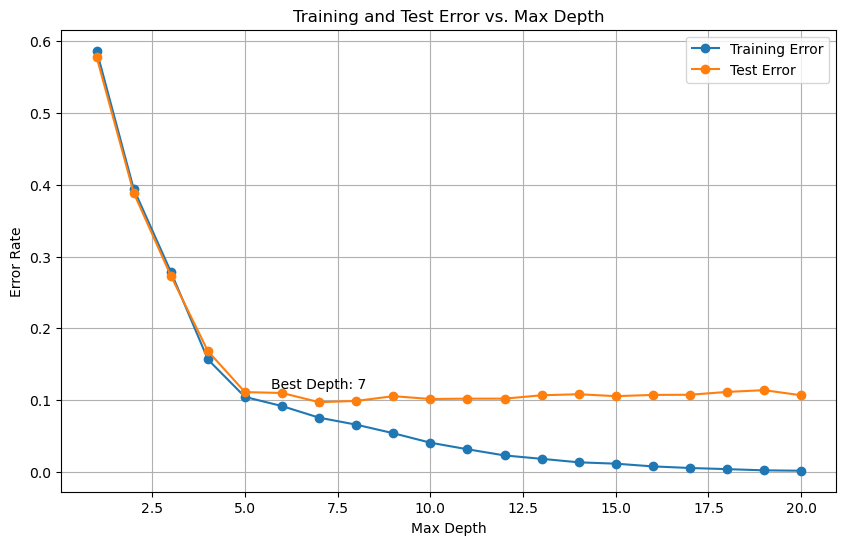

In [40]:
X = newdata[['DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor6', 'DFactor7', 'DFactor8', 'DFactor9', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4', 'Area']]
y = newdata['Class']

# Split your data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=428)

# Create lists to store training and test errors for different max_depth values
max_depths = list(range(1, 21))
train_errors = []
test_errors = []

# Train the model for different max_depth values and record the errors
for depth in max_depths:
    clf = DecisionTreeClassifier(max_depth=depth)
    clf.fit(X_train, y_train)
    
    # Training error
    y_train_pred = clf.predict(X_train)
    train_error = 1 - accuracy_score(y_train, y_train_pred)
    train_errors.append(train_error)
    
    # Test error
    y_test_pred = clf.predict(X_test)
    test_error = 1 - accuracy_score(y_test, y_test_pred)
    test_errors.append(test_error)

# Find the best depth with minimum test error
best_depth = max_depths[np.argmin(test_errors)]

# Create a plot to visualize the errors and annotate the best depth
plt.figure(figsize=(10, 6))
plt.plot(max_depths, train_errors, label="Training Error", marker='o')
plt.plot(max_depths, test_errors, label="Test Error", marker='o')
plt.xlabel("Max Depth")
plt.ylabel("Error Rate")
plt.title("Training and Test Error vs. Max Depth")
plt.legend()
plt.grid()
plt.annotate(f'Best Depth: {best_depth}', (best_depth, min(test_errors)), textcoords="offset points", xytext=(0, 10), ha='center')
plt.scatter(best_depth, min(test_errors), color='red', marker='*')
plt.show()


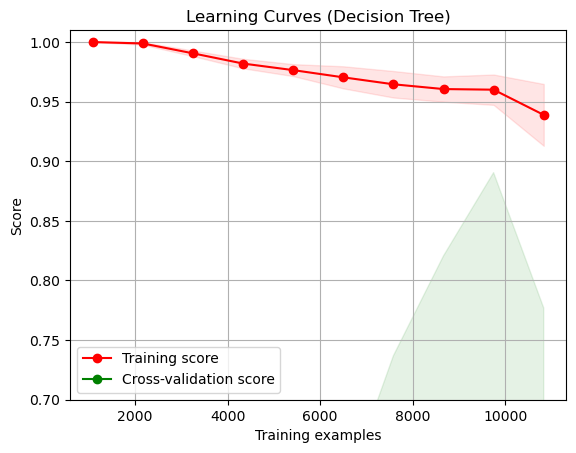

In [17]:
from sklearn.model_selection import learning_curve
def plot_learning_curves(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=1, train_sizes=np.linspace(.1, 1.0, 10)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    # Annotate the plot with accuracy labels
    for i, acc in enumerate(test_scores_mean):
        plt.annotate(f'Accuracy={acc:.2f}', (train_sizes[i], test_scores_mean[i]), fontsize=8, ha='right', va='bottom')
    
    plt.legend(loc="best")
    return plt

# Specify your estimator (e.g., DecisionTreeClassifier)
estimator = DecisionTreeClassifier(max_depth=8, min_samples_split=3)

# Plot learning curves with accuracy labels
plot_learning_curves(estimator, "Learning Curves (Decision Tree)", X, y, ylim=(0.7, 1.01), cv=5, n_jobs=-1)

plt.show()


- increasing training data to=15

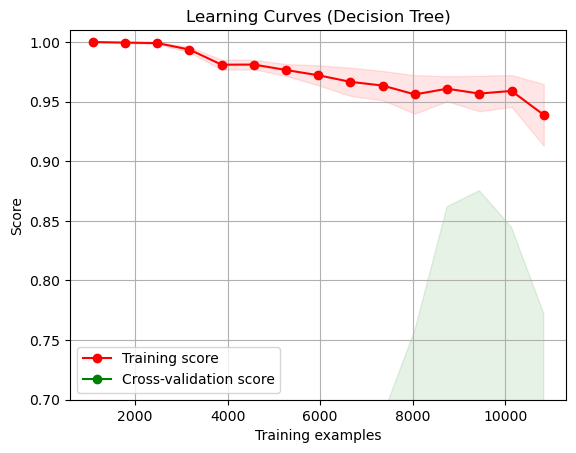

In [18]:
def plot_learning_curves(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=1, train_sizes=np.linspace(.1, 1.0, 15)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    # Annotate the plot with accuracy labels
    for i, acc in enumerate(test_scores_mean):
        plt.annotate(f'Accuracy={acc:.2f}', (train_sizes[i], test_scores_mean[i]), fontsize=8, ha='right', va='bottom')
    
    plt.legend(loc="best")
    return plt

# Specify your estimator (e.g., DecisionTreeClassifier)
estimator = DecisionTreeClassifier(max_depth=8, min_samples_split=3)

# Plot learning curves with accuracy labels
plot_learning_curves(estimator, "Learning Curves (Decision Tree)", X, y, ylim=(0.7, 1.01), cv=5, n_jobs=-1)

plt.show()


- increasing training data to 20

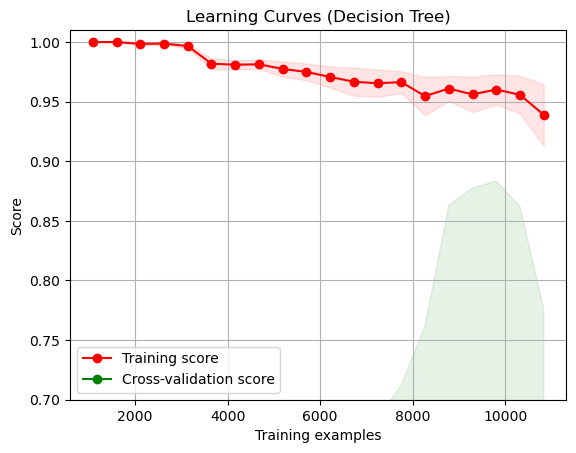

In [19]:
def plot_learning_curves(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=1, train_sizes=np.linspace(.1, 1.0, 20)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    # Annotate the plot with accuracy labels
    for i, acc in enumerate(test_scores_mean):
        plt.annotate(f'Accuracy={acc:.2f}', (train_sizes[i], test_scores_mean[i]), fontsize=8, ha='right', va='bottom')
    
    plt.legend(loc="best")
    return plt

# Specify your estimator (e.g., DecisionTreeClassifier)
estimator = DecisionTreeClassifier(max_depth=8, min_samples_split=3)

# Plot learning curves with accuracy labels
plot_learning_curves(estimator, "Learning Curves (Decision Tree)", X, y, ylim=(0.7, 1.01), cv=5, n_jobs=-1)

plt.show()


### Decision Boundaries

In [13]:
newdata.head()

,Area,DFactor1,DFactor2,DFactor3,DFactor4,DFactor6,DFactor7,DFactor8,DFactor9,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395.0,173.888747,1.197191,0.549812,28715.0,0.763923,0.988856,0.958027,0.913358,0.003147,0.834222,0.998724,SE
1,28734.0,182.734419,1.097356,0.750315,29172.0,0.783968,0.984986,0.887034,0.953861,0.001719,0.909851,0.998430,SE
2,29380.0,175.931143,1.209713,0.562727,29690.0,0.778113,0.989559,0.947849,0.908774,0.003048,0.825871,0.999066,SE
3,30008.0,182.516516,1.153638,0.498616,30724.0,0.782681,0.976696,0.903936,0.928329,0.003215,0.861794,0.994199,SE
4,30140.0,190.279279,1.060798,0.750315,30417.0,0.773098,0.990893,0.984877,0.970516,0.001719,0.644341,0.999166,SE


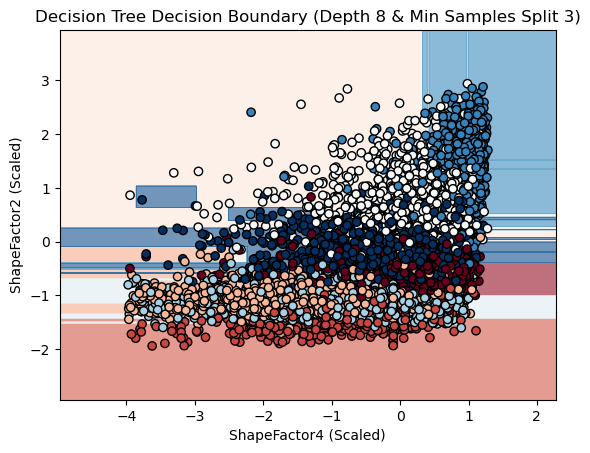

In [19]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
X = newdata[['ShapeFactor4', 'ShapeFactor2']]
y = newdata['Class']

# Encode the target variable using LabelEncoder
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=428)

# Create a StandardScaler to scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a Decision Tree classifier
model = DecisionTreeClassifier(max_depth=8, min_samples_split=3)
model.fit(X_train_scaled, y_train)

# Create a meshgrid of ShapeFactor4 and ShapeFactor2 values
xx, yy = np.meshgrid(np.arange(X_train_scaled[:, 0].min() - 1, X_train_scaled[:, 0].max() + 1, 0.01),
                     np.arange(X_train_scaled[:, 1].min() - 1, X_train_scaled[:, 1].max() + 1, 0.01))

# Use the model to make predictions on the meshgrid
Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Convert Z to a numeric type (e.g., float) to avoid ufunc 'isnan' error
Z = Z.astype(float)

# Handle non-finite values in Z (e.g., replace NaNs with a specific value)
Z[np.isnan(Z)] = 0  # Replace NaNs with 0 (or any other value)

# Plot the decision boundary
plt.contourf(xx, yy, Z, cmap=plt.cm.RdBu, alpha=0.6)

# Plot the data points
plt.scatter(X_train_scaled[:, 0], X_train_scaled[:, 1], c=y_train, edgecolors='k', cmap=plt.cm.RdBu)
plt.xlabel('ShapeFactor4 (Scaled)')
plt.ylabel('ShapeFactor2 (Scaled)')
plt.title('Decision Tree Decision Boundary (Depth 8 & Min Samples Split 3)')

# Show the plot
plt.show()


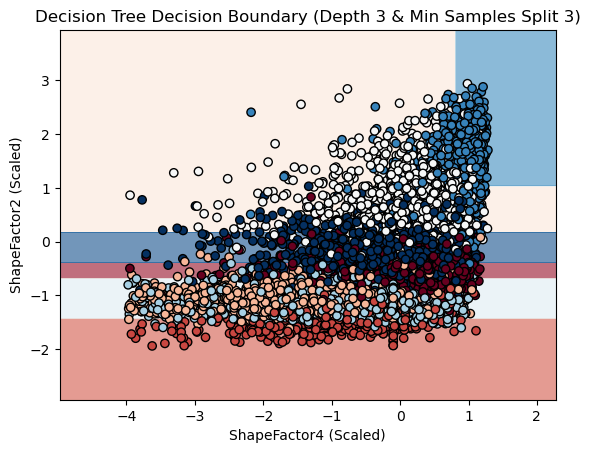

In [21]:
# Create a Decision Tree classifier
model = DecisionTreeClassifier(max_depth=3, min_samples_split=3)
model.fit(X_train_scaled, y_train)

# Create a meshgrid of ShapeFactor4 and ShapeFactor2 values
xx, yy = np.meshgrid(np.arange(X_train_scaled[:, 0].min() - 1, X_train_scaled[:, 0].max() + 1, 0.01),
                     np.arange(X_train_scaled[:, 1].min() - 1, X_train_scaled[:, 1].max() + 1, 0.01))

# Use the model to make predictions on the meshgrid
Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Convert Z to a numeric type (e.g., float) to avoid ufunc 'isnan' error
Z = Z.astype(float)

# Handle non-finite values in Z (e.g., replace NaNs with a specific value)
Z[np.isnan(Z)] = 0  # Replace NaNs with 0 (or any other value)

# Plot the decision boundary
plt.contourf(xx, yy, Z, cmap=plt.cm.RdBu, alpha=0.6)

# Plot the data points
plt.scatter(X_train_scaled[:, 0], X_train_scaled[:, 1], c=y_train, edgecolors='k', cmap=plt.cm.RdBu)
plt.xlabel('ShapeFactor4 (Scaled)')
plt.ylabel('ShapeFactor2 (Scaled)')
plt.title('Decision Tree Decision Boundary (Depth 3 & Min Samples Split 3)')

# Show the plot
plt.show()


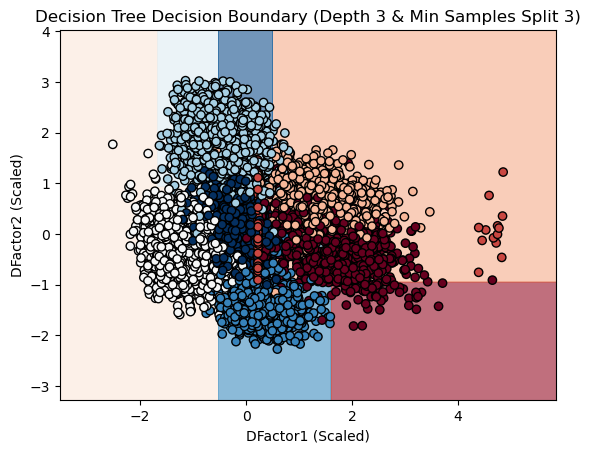

In [4]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
X = newdata[['DFactor1', 'DFactor2']]
y = newdata['Class']

# Encode the target variable using LabelEncoder
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=428)

# Create a StandardScaler to scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a Decision Tree classifier
model = DecisionTreeClassifier(max_depth=3, min_samples_split=3)
model.fit(X_train_scaled, y_train)

# Create a meshgrid of ShapeFactor4 and ShapeFactor2 values
xx, yy = np.meshgrid(np.arange(X_train_scaled[:, 0].min() - 1, X_train_scaled[:, 0].max() + 1, 0.01),
                     np.arange(X_train_scaled[:, 1].min() - 1, X_train_scaled[:, 1].max() + 1, 0.01))

# Use the model to make predictions on the meshgrid
Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Convert Z to a numeric type (e.g., float) to avoid ufunc 'isnan' error
Z = Z.astype(float)

# Handle non-finite values in Z (e.g., replace NaNs with a specific value)
Z[np.isnan(Z)] = 0  # Replace NaNs with 0 (or any other value)

# Plot the decision boundary
plt.contourf(xx, yy, Z, cmap=plt.cm.RdBu, alpha=0.6)

# Plot the data points
plt.scatter(X_train_scaled[:, 0], X_train_scaled[:, 1], c=y_train, edgecolors='k', cmap=plt.cm.RdBu)
plt.xlabel('DFactor1 (Scaled)')
plt.ylabel('DFactor2 (Scaled)')
plt.title('Decision Tree Decision Boundary (Depth 3 & Min Samples Split 3)')

# Show the plot
plt.show()


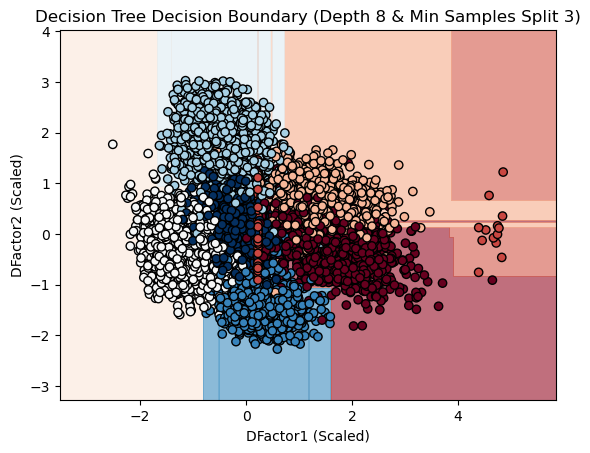

In [5]:
# Create a Decision Tree classifier
model = DecisionTreeClassifier(max_depth=8, min_samples_split=3)
model.fit(X_train_scaled, y_train)

# Create a meshgrid of ShapeFactor4 and ShapeFactor2 values
xx, yy = np.meshgrid(np.arange(X_train_scaled[:, 0].min() - 1, X_train_scaled[:, 0].max() + 1, 0.01),
                     np.arange(X_train_scaled[:, 1].min() - 1, X_train_scaled[:, 1].max() + 1, 0.01))

# Use the model to make predictions on the meshgrid
Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Convert Z to a numeric type (e.g., float) to avoid ufunc 'isnan' error
Z = Z.astype(float)

# Handle non-finite values in Z (e.g., replace NaNs with a specific value)
Z[np.isnan(Z)] = 0  # Replace NaNs with 0 (or any other value)

# Plot the decision boundary
plt.contourf(xx, yy, Z, cmap=plt.cm.RdBu, alpha=0.6)

# Plot the data points
plt.scatter(X_train_scaled[:, 0], X_train_scaled[:, 1], c=y_train, edgecolors='k', cmap=plt.cm.RdBu)
plt.xlabel('DFactor1 (Scaled)')
plt.ylabel('DFactor2 (Scaled)')
plt.title('Decision Tree Decision Boundary (Depth 8 & Min Samples Split 3)')

# Show the plot
plt.show()


### Random Forest

Feature Importances:
         Feature  Importance
0       DFactor1    0.147323
3       DFactor4    0.140163
7       DFactor9    0.128701
11          Area    0.117429
9   ShapeFactor3    0.105783
8   ShapeFactor2    0.105673
6       DFactor8    0.062877
2       DFactor3    0.062506
1       DFactor2    0.058310
10  ShapeFactor4    0.033769
5       DFactor7    0.023423
4       DFactor6    0.014042


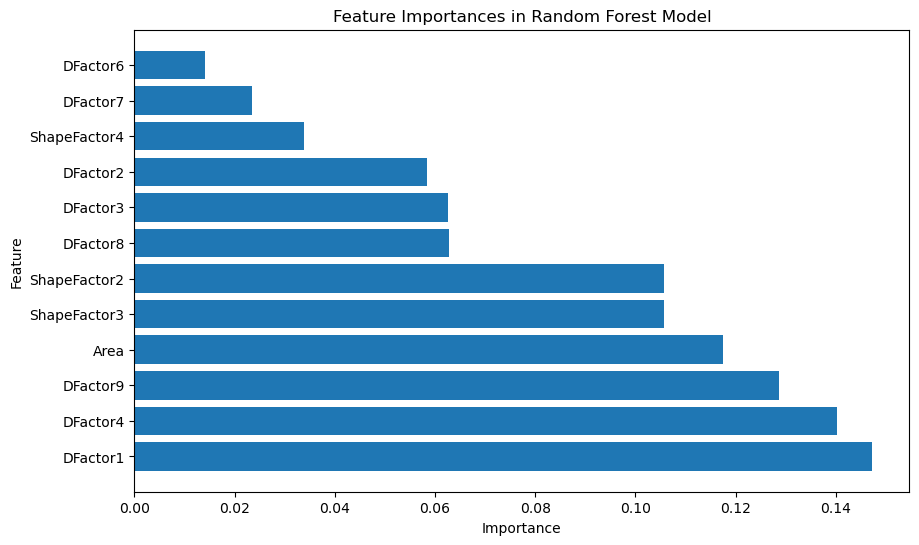

Accuracy on the test set: 0.92


In [5]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Select features and target variable
X = newdata[['DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor6', 'DFactor7',
             'DFactor8', 'DFactor9', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4', 'Area']]
y = newdata['Class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a StandardScaler to scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

model = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the Random Forest model on the scaled training data
model.fit(X_train_scaled, y_train)

# Get feature importances
feature_importances = model.feature_importances_

# Create a DataFrame to associate feature names with importances
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Print the feature importances
print("Feature Importances:")
print(feature_importance_df)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances in Random Forest Model')
plt.show()

# Make predictions on the test set
y_pred = model.predict(X_test_scaled)

# Evaluate the model (e.g., calculate accuracy, use other metrics)
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy on the test set: {accuracy:.2f}")


### Hyperparameters Tuning

In [6]:
X = newdata[['DFactor1','DFactor3','DFactor8', 'DFactor4','DFactor9', 'ShapeFactor2', 'ShapeFactor3', 'Area']]
y = newdata['Class']
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=5)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
# Random Forest Classifier
rf_classifier = RandomForestClassifier(n_estimators=50, random_state=42, max_depth= 10,
                                       min_samples_split=2, min_samples_leaf=2)
rf_classifier.fit(X_train, y_train)
rf_predictions = rf_classifier.predict(X_test)
rf_accuracy = accuracy_score(y_test, rf_predictions)
print("Random Forest Accuracy:", rf_accuracy)

Random Forest Accuracy: 0.9110372831303064


In [7]:
X = newdata[['DFactor1','DFactor3','DFactor8', 'DFactor4','DFactor9', 'ShapeFactor2', 'ShapeFactor3', 'Area']]
y = newdata['Class']
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=5)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
# Random Forest Classifier
rf_classifier = RandomForestClassifier(n_estimators=400, random_state=42, max_depth= 9,
                                       min_samples_split=3, min_samples_leaf=4)
rf_classifier.fit(X_train, y_train)
rf_predictions = rf_classifier.predict(X_test)
rf_accuracy = accuracy_score(y_test, rf_predictions)
print("Random Forest Accuracy:", rf_accuracy)

Random Forest Accuracy: 0.9069767441860465


### Cross Validation

In [8]:
X = newdata[['DFactor1', 'DFactor3', 'DFactor8', 'DFactor4', 'DFactor9', 'ShapeFactor2', 'ShapeFactor3', 'Area']]
y = newdata['Class']

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=5)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=5)

# Create a StandardScaler to scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Create a Random Forest classifier
rf_classifier = RandomForestClassifier(n_estimators=50, random_state=42, max_depth=10,
                                       min_samples_split=2, min_samples_leaf=2)

# Train the Random Forest model on the training data
rf_classifier.fit(X_train_scaled, y_train)

# Make predictions on the validation set
y_pred = rf_classifier.predict(X_val_scaled)

# Calculate accuracy on the validation set
accuracy = accuracy_score(y_val, y_pred)
print("Validation Set Accuracy:", accuracy)

# Display classification report on the validation set
print(classification_report(y_val, y_pred))

# Make predictions on the test set
y_test_pred = rf_classifier.predict(X_test_scaled)

# Calculate accuracy on the test set
test_accuracy = accuracy_score(y_test, y_test_pred)
print("Test Set Accuracy:", test_accuracy)

Validation Set Accuracy: 0.9098966026587888
              precision    recall  f1-score   support

          BA       0.92      0.84      0.88       189
          BO       1.00      1.00      1.00        76
          CA       0.89      0.93      0.91       251
          DE       0.92      0.91      0.92       541
          HO       0.95      0.94      0.94       287
          SE       0.95      0.93      0.94       323
          SI       0.83      0.87      0.85       364

    accuracy                           0.91      2031
   macro avg       0.92      0.92      0.92      2031
weighted avg       0.91      0.91      0.91      2031

Test Set Accuracy: 0.9187992125984252


#### Decision Boundaries

C:\Users\negar\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


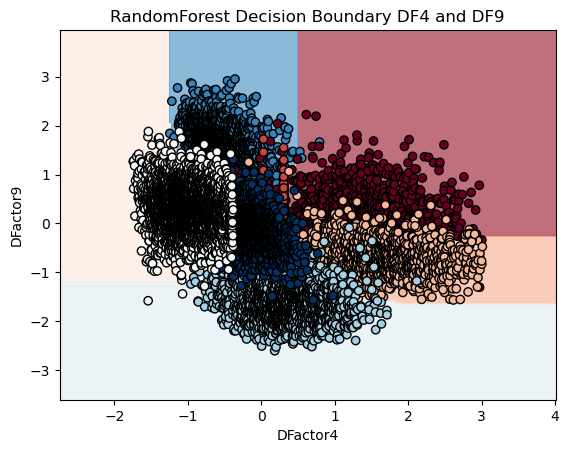

In [13]:
from sklearn.ensemble import RandomForestClassifier

X = newdatarandom[['DFactor4','DFactor9']]
y = newdatarandom['Class']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = RandomForestClassifier(n_estimators=400, random_state=42, max_depth= 9,
                                       min_samples_split=3, min_samples_leaf=4)
model.fit(X_train, y_train)

xx, yy = np.meshgrid(np.arange(X['DFactor4'].min() - 1, X['DFactor4'].max() + 1, 0.01),
                     np.arange(X['DFactor9'].min() - 1, X['DFactor9'].max() + 1, 0.01))

# Use the model to make predictions on the meshgrid
Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot the decision boundary
plt.contourf(xx, yy, Z, cmap=plt.cm.RdBu, alpha=0.6)

# Plot the data points
plt.scatter(X['DFactor4'], X['DFactor9'], c=y, edgecolors='k', cmap=plt.cm.RdBu)
plt.xlabel('DFactor4')
plt.ylabel('DFactor9')
plt.title('RandomForest Decision Boundary DF4 and DF9')

# Show the plot
plt.show()

C:\Users\negar\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


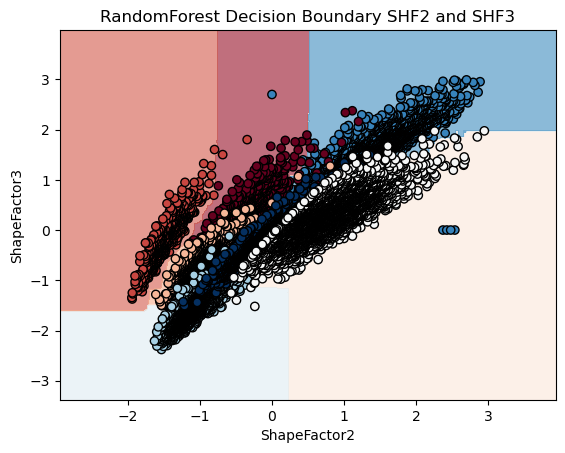

In [15]:
from sklearn.ensemble import RandomForestClassifier

X = newdatarandom[['ShapeFactor2', 'ShapeFactor3']]
y = newdatarandom['Class']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = RandomForestClassifier(n_estimators=400, random_state=42, max_depth= 9,
                                       min_samples_split=3, min_samples_leaf=4)
model.fit(X_train, y_train)

xx, yy = np.meshgrid(np.arange(X['ShapeFactor2'].min() - 1, X['ShapeFactor2'].max() + 1, 0.01),
                     np.arange(X['ShapeFactor3'].min() - 1, X['ShapeFactor3'].max() + 1, 0.01))

# Use the model to make predictions on the meshgrid
Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot the decision boundary
plt.contourf(xx, yy, Z, cmap=plt.cm.RdBu, alpha=0.6)

# Plot the data points
plt.scatter(X['ShapeFactor2'], X['ShapeFactor3'], c=y, edgecolors='k', cmap=plt.cm.RdBu)
plt.xlabel('ShapeFactor2')
plt.ylabel('ShapeFactor3')
plt.title('RandomForest Decision Boundary SHF2 and SHF3')

# Show the plot
plt.show()

C:\Users\negar\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


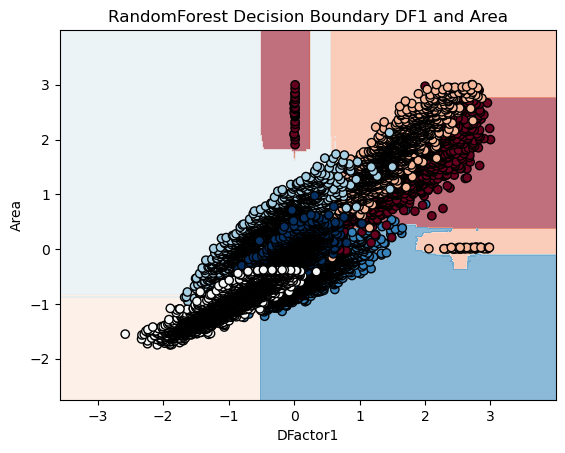

In [16]:
from sklearn.ensemble import RandomForestClassifier

X = newdatarandom[['DFactor1', 'Area']]
y = newdatarandom['Class']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = RandomForestClassifier(n_estimators=400, random_state=42, max_depth= 9,
                                       min_samples_split=3, min_samples_leaf=4)
model.fit(X_train, y_train)

xx, yy = np.meshgrid(np.arange(X['DFactor1'].min() - 1, X['DFactor1'].max() + 1, 0.01),
                     np.arange(X['Area'].min() - 1, X['Area'].max() + 1, 0.01))

# Use the model to make predictions on the meshgrid
Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot the decision boundary
plt.contourf(xx, yy, Z, cmap=plt.cm.RdBu, alpha=0.6)

# Plot the data points
plt.scatter(X['DFactor1'], X['Area'], c=y, edgecolors='k', cmap=plt.cm.RdBu)
plt.xlabel('DFactor1')
plt.ylabel('Area')
plt.title('RandomForest Decision Boundary DF1 and Area')

# Show the plot
plt.show()

### KNN

In [7]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X = newdata[['DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor6', 'DFactor7', 'DFactor8',
                'DFactor9', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4', 'Area']]
y = newdata['Class']

# Split the data into training, validation, and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Create a StandardScaler to scale the features
scaler = StandardScaler()

# Scale the data
X_train_scaled = scaler.fit_transform(X_train)
X_valid_scaled = scaler.transform(X_valid)
X_test_scaled = scaler.transform(X_test)

model_choices = []
valid_acc = []
n_valid = y_valid.shape[0]

for k in range(1, 11):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train_scaled, y_train)
    y_valid_pred = knn.predict(X_valid_scaled)
    accuracy = np.sum(y_valid_pred == y_valid) / n_valid
    model_choices.append(k)
    valid_acc.append(accuracy)

best_valid_K = model_choices[valid_acc.index(max(valid_acc))]
knn = KNeighborsClassifier(n_neighbors=best_valid_K)
knn.fit(X_train_scaled, y_train)

y_test_pred = knn.predict(X_test_scaled)
accuracy = np.sum(y_test_pred == y_test) / y_test.shape[0]

print("Accuracy:", accuracy)

Accuracy: 0.9158361018826136


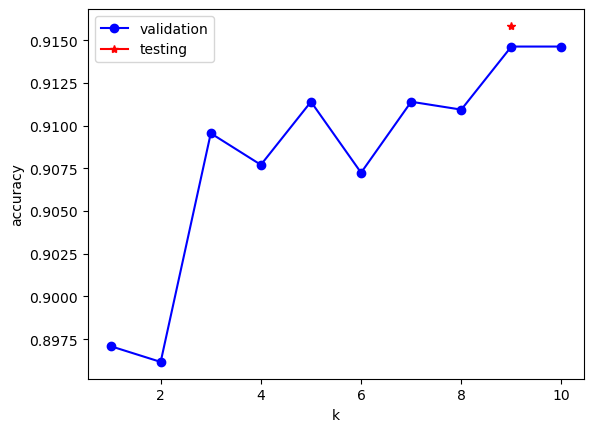

In [9]:
plt.clf()
plt.plot(model_choices, valid_acc, marker='o', color='blue', label='validation')
plt.plot(best_valid_K, accuracy, marker='*', color='red', label='testing') 
plt.xlabel('k')
plt.ylabel('accuracy')
plt.legend(loc='best')
plt.savefig('training_validation_testing.png', bbox_inches='tight', dpi=300)

In [10]:
from sklearn.metrics import accuracy_score, classification_report

X = newdata[['DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor6', 'DFactor7', 'DFactor8',
                'DFactor9', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4', 'Area']]
y = newdata['Class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42)
scaler = StandardScaler()

# Scale the data
X_train_scaled = scaler.fit_transform(X_train)
X_valid_scaled = scaler.transform(X_valid)
X_test_scaled = scaler.transform(X_test)

# Set k to 10 (the number of neighbors)
k = 9

# Create and fit the KNeighborsClassifier with k=10
knn = KNeighborsClassifier(n_neighbors=k)
knn.fit(X_train, y_train)

# Make predictions on the test set
y_test_pred = knn.predict(X_test)
y_pred = knn.predict(X_test)
# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Display classification report
print(classification_report(y_test, y_pred))

Accuracy: 0.6781100036913991
              precision    recall  f1-score   support

          BA       0.49      0.44      0.46       259
          BO       1.00      1.00      1.00       114
          CA       0.63      0.63      0.63       305
          DE       0.77      0.86      0.81       707
          HO       0.64      0.60      0.62       376
          SE       0.68      0.47      0.56       414
          SI       0.62      0.73      0.67       534

    accuracy                           0.68      2709
   macro avg       0.69      0.68      0.68      2709
weighted avg       0.68      0.68      0.67      2709



### Deciosion Boundaries

C:\Users\negar\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


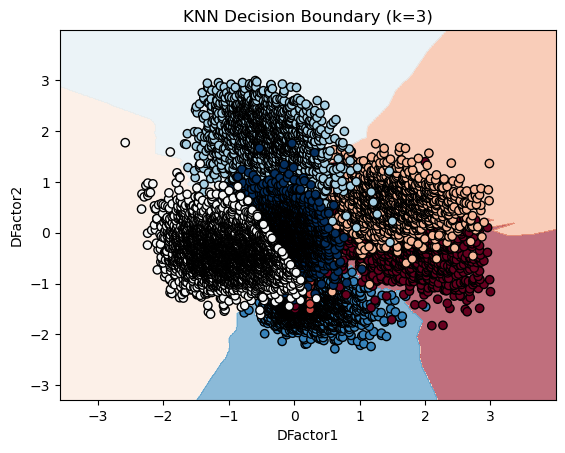

In [5]:
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier

# Select the features
X = newdata[['DFactor1', 'DFactor2']]

# Target variable
y = newdata['Class']

# Train a KNN model with k=3
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X, y)

# Create a meshgrid of points to cover the feature space
x_min, x_max = X['DFactor1'].min() - 1, X['DFactor1'].max() + 1
y_min, y_max = X['DFactor2'].min() - 1, X['DFactor2'].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01), np.arange(y_min, y_max, 0.01))

# Use the model to make predictions on the meshgrid
Z = knn.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot the decision boundary
plt.contourf(xx, yy, Z, cmap=plt.cm.RdBu, alpha=0.6)

# Plot the data points
plt.scatter(X['DFactor1'], X['DFactor2'], c=y, edgecolors='k', cmap=plt.cm.RdBu)
plt.xlabel('DFactor1')
plt.ylabel('DFactor2')
plt.title('KNN Decision Boundary (k=3)')

# Show the plot
plt.show()

C:\Users\negar\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


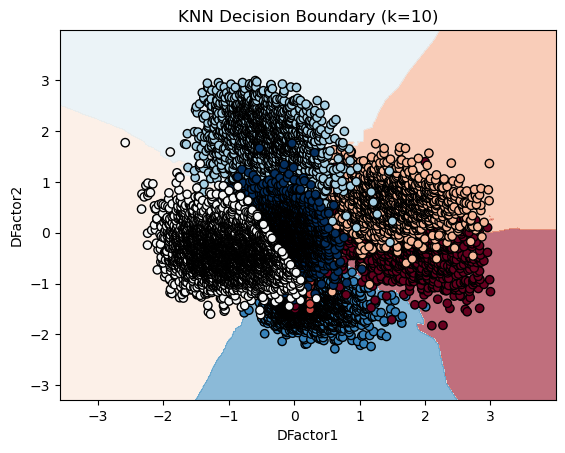

In [7]:
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier

# Select the features
X = newdata[['DFactor1', 'DFactor2']]

# Target variable
y = newdata['Class']

# Train a KNN model with k=3
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X, y)

# Create a meshgrid of points to cover the feature space
x_min, x_max = X['DFactor1'].min() - 1, X['DFactor1'].max() + 1
y_min, y_max = X['DFactor2'].min() - 1, X['DFactor2'].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01), np.arange(y_min, y_max, 0.01))

# Use the model to make predictions on the meshgrid
Z = knn.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot the decision boundary
plt.contourf(xx, yy, Z, cmap=plt.cm.RdBu, alpha=0.6)

# Plot the data points
plt.scatter(X['DFactor1'], X['DFactor2'], c=y, edgecolors='k', cmap=plt.cm.RdBu)
plt.xlabel('DFactor1')
plt.ylabel('DFactor2')
plt.title('KNN Decision Boundary (k=10)')

# Show the plot
plt.show()

C:\Users\negar\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


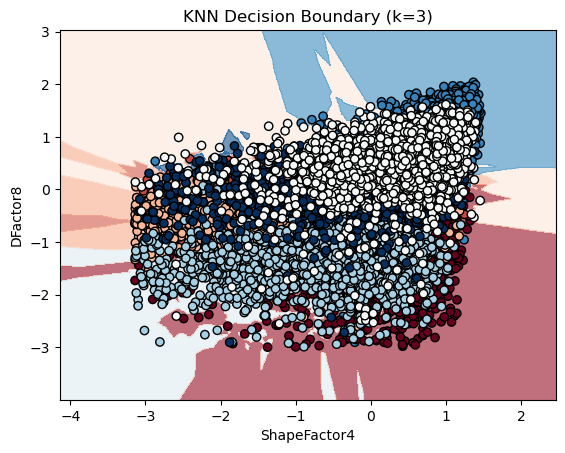

In [9]:
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier

# Select the features
X = newdata[['ShapeFactor4', 'DFactor8']]

# Target variable
y = newdata['Class']

# Train a KNN model with k=3
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X, y)

# Create a meshgrid of points to cover the feature space
x_min, x_max = X['ShapeFactor4'].min() - 1, X['ShapeFactor4'].max() + 1
y_min, y_max = X['DFactor8'].min() - 1, X['DFactor8'].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01), np.arange(y_min, y_max, 0.01))

# Use the model to make predictions on the meshgrid
Z = knn.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot the decision boundary
plt.contourf(xx, yy, Z, cmap=plt.cm.RdBu, alpha=0.6)

# Plot the data points
plt.scatter(X['ShapeFactor4'], X['DFactor8'], c=y, edgecolors='k', cmap=plt.cm.RdBu)
plt.xlabel('ShapeFactor4')
plt.ylabel('DFactor8')
plt.title('KNN Decision Boundary (k=3)')

# Show the plot
plt.show()

C:\Users\negar\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


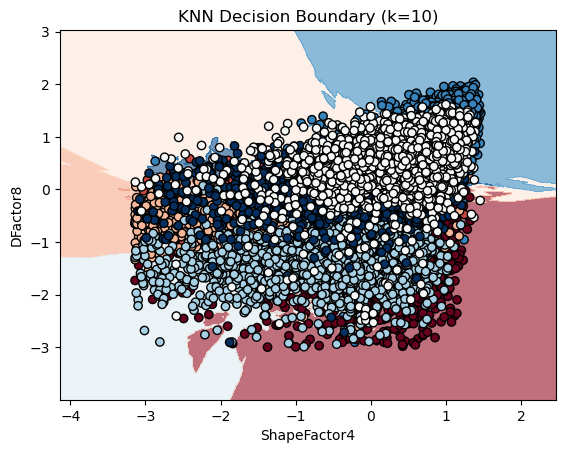

In [11]:
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier

# Select the features
X = newdata[['ShapeFactor4', 'DFactor8']]

# Target variable
y = newdata['Class']

# Train a KNN model with k=3
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X, y)

# Create a meshgrid of points to cover the feature space
x_min, x_max = X['ShapeFactor4'].min() - 1, X['ShapeFactor4'].max() + 1
y_min, y_max = X['DFactor8'].min() - 1, X['DFactor8'].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01), np.arange(y_min, y_max, 0.01))

# Use the model to make predictions on the meshgrid
Z = knn.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot the decision boundary
plt.contourf(xx, yy, Z, cmap=plt.cm.RdBu, alpha=0.6)

# Plot the data points
plt.scatter(X['ShapeFactor4'], X['DFactor8'], c=y, edgecolors='k', cmap=plt.cm.RdBu)
plt.xlabel('ShapeFactor4')
plt.ylabel('DFactor8')
plt.title('KNN Decision Boundary (k=10)')

# Show the plot
plt.show()

C:\Users\negar\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


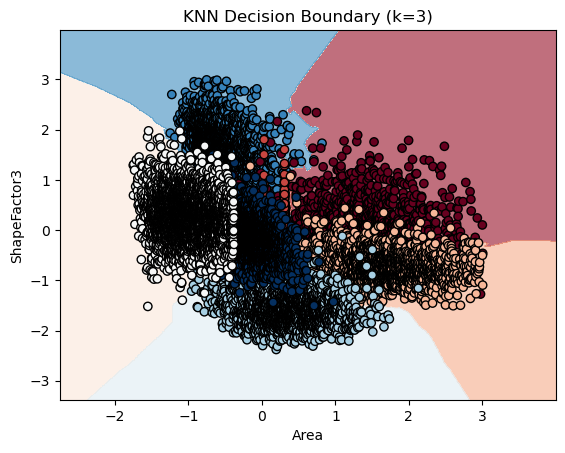

In [12]:
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier

# Select the features
X = newdata[['Area', 'ShapeFactor3']]

# Target variable
y = newdata['Class']

# Train a KNN model with k=3
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X, y)

# Create a meshgrid of points to cover the feature space
x_min, x_max = X['Area'].min() - 1, X['Area'].max() + 1
y_min, y_max = X['ShapeFactor3'].min() - 1, X['ShapeFactor3'].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01), np.arange(y_min, y_max, 0.01))

# Use the model to make predictions on the meshgrid
Z = knn.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot the decision boundary
plt.contourf(xx, yy, Z, cmap=plt.cm.RdBu, alpha=0.6)

# Plot the data points
plt.scatter(X['Area'], X['ShapeFactor3'], c=y, edgecolors='k', cmap=plt.cm.RdBu)
plt.xlabel('Area')
plt.ylabel('ShapeFactor3')
plt.title('KNN Decision Boundary (k=3)')

# Show the plot
plt.show()

C:\Users\negar\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


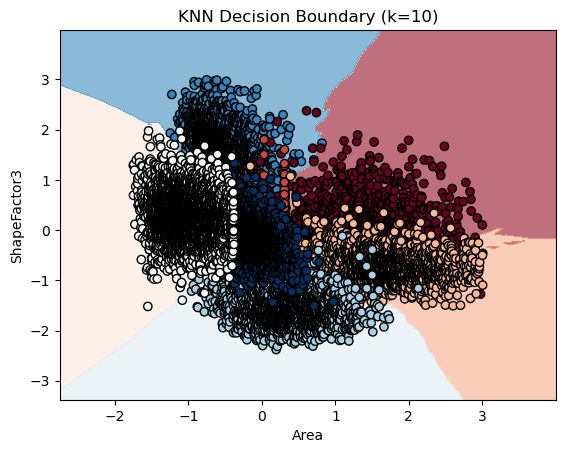

In [13]:
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier

# Select the features
X = newdata[['Area', 'ShapeFactor3']]

# Target variable
y = newdata['Class']

# Train a KNN model with k=3
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X, y)

# Create a meshgrid of points to cover the feature space
x_min, x_max = X['Area'].min() - 1, X['Area'].max() + 1
y_min, y_max = X['ShapeFactor3'].min() - 1, X['ShapeFactor3'].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01), np.arange(y_min, y_max, 0.01))

# Use the model to make predictions on the meshgrid
Z = knn.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot the decision boundary
plt.contourf(xx, yy, Z, cmap=plt.cm.RdBu, alpha=0.6)

# Plot the data points
plt.scatter(X['Area'], X['ShapeFactor3'], c=y, edgecolors='k', cmap=plt.cm.RdBu)
plt.xlabel('Area')
plt.ylabel('ShapeFactor3')
plt.title('KNN Decision Boundary (k=10)')

# Show the plot
plt.show()

### Logistic Regression

In [8]:
# Define your feature sets
X = newdata[['DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor6', 'DFactor7', 'DFactor8',
            'DFactor9', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4', 'Area']]
y = newdata['Class']

# Split your data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the logistic regression model
logistic_reg = LogisticRegression()

# Define a grid of hyperparameters to search
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],  # Inverse of regularization strength
    'penalty': ['l1', 'l2'],  # Regularization penalty type
}

# Use grid search to find the best combination of features and hyperparameters
grid_search = GridSearchCV(logistic_reg, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train_scaled, y_train)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Create the final model with the best hyperparameters
final_model = LogisticRegression(**best_params)
final_model.fit(X_train_scaled, y_train)

# Evaluate the final model using cross-validation or on the test set
cross_val_scores = cross_val_score(final_model, X_train_scaled, y_train, cv=5, scoring='accuracy')
test_accuracy = accuracy_score(y_test, final_model.predict(X_test_scaled))

# Print the results
print("Best Hyperparameters:", best_params)
print("Cross-Validation Accuracy:", cross_val_scores.mean())
print("Test Set Accuracy:", test_accuracy)

C:\Users\negar\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\negar\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

Best Hyperparameters: {'C': 100, 'penalty': 'l2'}
Cross-Validation Accuracy: 0.9225586858361019
Test Set Accuracy: 0.9217423403469915


C:\Users\negar\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [9]:
X = newdata[['DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor6', 'DFactor7', 'DFactor8',
            'DFactor9', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4', 'Area']]
y = newdata['Class']

# Split your data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the logistic regression model with the optimized hyperparameters
logistic_reg = LogisticRegression(C=100, penalty='l2', random_state=42)

# Train the model on the training data
logistic_reg.fit(X_train_scaled, y_train)

# Make predictions on the test data
y_pred = logistic_reg.predict(X_test_scaled)

# Calculate and print accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Display the classification report
print(classification_report(y_test, y_pred))

Accuracy: 0.9217423403469915
              precision    recall  f1-score   support

          BA       0.92      0.90      0.91       259
          BO       1.00      1.00      1.00       114
          CA       0.92      0.94      0.93       305
          DE       0.93      0.91      0.92       707
          HO       0.96      0.94      0.95       376
          SE       0.94      0.95      0.94       414
          SI       0.86      0.88      0.87       534

    accuracy                           0.92      2709
   macro avg       0.93      0.93      0.93      2709
weighted avg       0.92      0.92      0.92      2709



C:\Users\negar\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


C:\Users\negar\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


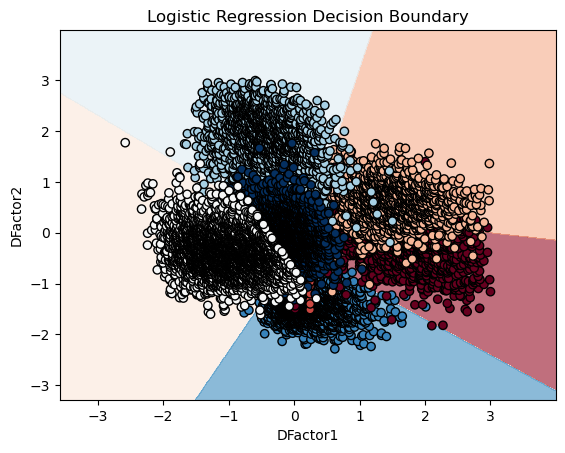

In [10]:
X = newdata[['DFactor1', 'DFactor2']]

# Target variable
y = newdata['Class']

# Train a logistic regression model
logistic_reg = LogisticRegression(C=100, penalty='l2', random_state=42)
logistic_reg.fit(X, y)

# Create a meshgrid of points to cover the feature space
x_min, x_max = X['DFactor1'].min() - 1, X['DFactor1'].max() + 1
y_min, y_max = X['DFactor2'].min() - 1, X['DFactor2'].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01), np.arange(y_min, y_max, 0.01))

# Use the model to make predictions on the meshgrid
Z = logistic_reg.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot the decision boundary
plt.contourf(xx, yy, Z, cmap=plt.cm.RdBu, alpha=0.6)

# Plot the data points
plt.scatter(X['DFactor1'], X['DFactor2'], c=y, edgecolors='k', cmap=plt.cm.RdBu)
plt.xlabel('DFactor1')
plt.ylabel('DFactor2')
plt.title('Logistic Regression Decision Boundary')

# Show the plot
plt.show()


C:\Users\negar\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


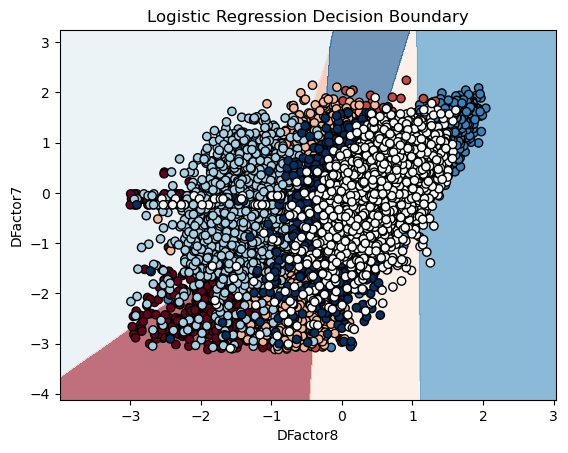

In [12]:
X = newdata[['DFactor8', 'DFactor7']]

# Target variable
y = newdata['Class']

# Train a logistic regression model
logistic_reg = LogisticRegression(C=100, penalty='l2', random_state=42)
logistic_reg.fit(X, y)

# Create a meshgrid of points to cover the feature space
x_min, x_max = X['DFactor8'].min() - 1, X['DFactor8'].max() + 1
y_min, y_max = X['DFactor7'].min() - 1, X['DFactor7'].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01), np.arange(y_min, y_max, 0.01))

# Use the model to make predictions on the meshgrid
Z = logistic_reg.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot the decision boundary
plt.contourf(xx, yy, Z, cmap=plt.cm.RdBu, alpha=0.6)

# Plot the data points
plt.scatter(X['DFactor8'], X['DFactor7'], c=y, edgecolors='k', cmap=plt.cm.RdBu)
plt.xlabel('DFactor8')
plt.ylabel('DFactor7')
plt.title('Logistic Regression Decision Boundary')

# Show the plot
plt.show()

C:\Users\negar\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


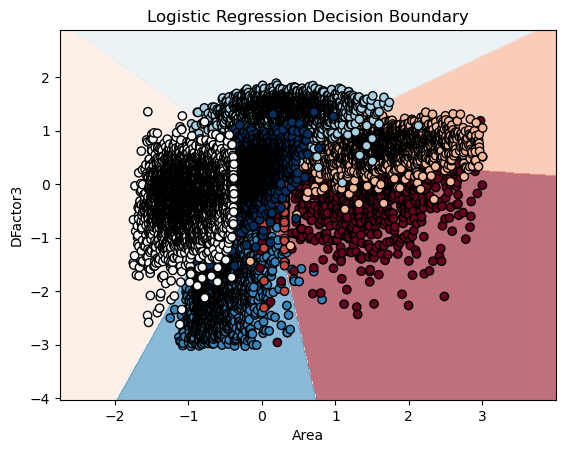

In [13]:
X = newdata[['Area', 'DFactor3']]

# Target variable
y = newdata['Class']

# Train a logistic regression model
logistic_reg = LogisticRegression(C=100, penalty='l2', random_state=42)
logistic_reg.fit(X, y)

# Create a meshgrid of points to cover the feature space
x_min, x_max = X['Area'].min() - 1, X['Area'].max() + 1
y_min, y_max = X['DFactor3'].min() - 1, X['DFactor3'].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01), np.arange(y_min, y_max, 0.01))

# Use the model to make predictions on the meshgrid
Z = logistic_reg.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot the decision boundary
plt.contourf(xx, yy, Z, cmap=plt.cm.RdBu, alpha=0.6)

# Plot the data points
plt.scatter(X['Area'], X['DFactor3'], c=y, edgecolors='k', cmap=plt.cm.RdBu)
plt.xlabel('Area')
plt.ylabel('DFactor3')
plt.title('Logistic Regression Decision Boundary')

# Show the plot
plt.show()

### Model Comparison

KNeighborsClassifier
RandomForestClassifier
DecisionTreeClassifier
LogisticRegression


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


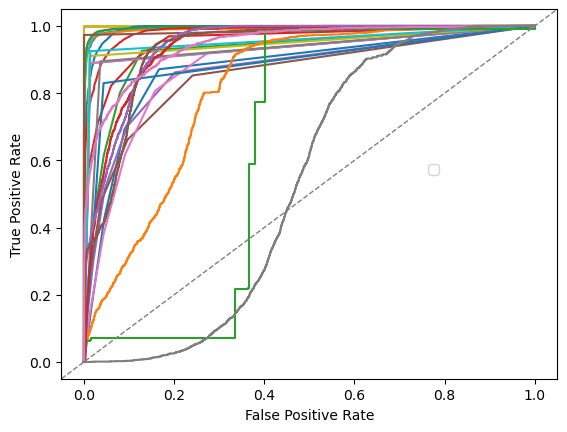

In [16]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

X = newdata[['DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor6', 'DFactor7', 'DFactor8', 
                'DFactor9', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4', 'Area']]
y = newdata['Class']

# Encode the string class labels as integers using LabelEncoder
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Binarize the output
y = label_binarize(y_encoded, classes=range(y_encoded.max() + 1))
n_classes = y.shape[1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

models = [KNeighborsClassifier(), RandomForestClassifier(), DecisionTreeClassifier(),LogisticRegression()]
pref = {}

def cross_validate(model, X_input, Y_output):
    kf = KFold(n_splits=5, random_state=42, shuffle=True)
    y = np.zeros((X_input.shape[0], n_classes))
    yh = np.zeros((X_input.shape[0], n_classes))
    
    for train_index, test_index in kf.split(X_input):
        model = OneVsRestClassifier(model)
        model.fit(X_input.iloc[train_index], Y_output[train_index])
        y[test_index] = Y_output[test_index]
        yh[test_index] = model.predict_proba(X_input.iloc[test_index])
    
    return y, yh

for model in models:
    model_name = type(model).__name__
    print(model_name)
    label, pred = cross_validate(model, X_train, y_train)
    
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(label[:, i], pred[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    pref[model_name] = {'fpr': fpr, 'tpr': tpr, 'roc_auc': roc_auc}

fig = plt.figure()
i = 0

for model_name, model_pref in pref.items():
    for i in range(n_classes):
        plt.plot(model_pref['fpr'][i], model_pref['tpr'][i])
    
    i += 1

plt.axline((0, 0), (1, 1), linestyle="--", lw=1, color="gray")
plt.legend(loc='upper center', bbox_to_anchor=(0.75, 0.6))
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.savefig('roc_multimethods.png', bbox_inches='tight', dpi=300)




DecisionTreeClassifier
RandomForestClassifier


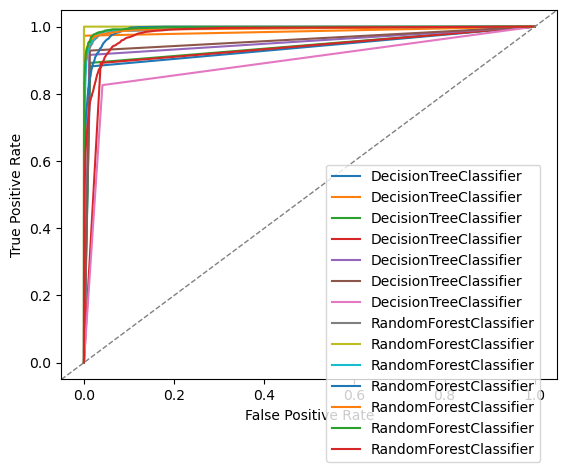

In [21]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

X = newdata[['DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor6', 'DFactor7', 'DFactor8', 
                'DFactor9', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4', 'Area']]
y = newdata['Class']

# Encode the string class labels as integers using LabelEncoder
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Binarize the output
y = label_binarize(y_encoded, classes=range(y_encoded.max() + 1))
n_classes = y.shape[1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

models = [DecisionTreeClassifier(), RandomForestClassifier()]
pref = {}

def cross_validate(model, X_input, Y_output):
    kf = KFold(n_splits=5, random_state=42, shuffle=True)
    y = np.zeros((X_input.shape[0], n_classes))
    yh = np.zeros((X_input.shape[0], n_classes))
    
    for train_index, test_index in kf.split(X_input):
        model = OneVsRestClassifier(model)
        model.fit(X_input.iloc[train_index], Y_output[train_index])
        y[test_index] = Y_output[test_index]
        yh[test_index] = model.predict_proba(X_input.iloc[test_index])
    
    return y, yh

for model in models:
    model_name = type(model).__name__
    print(model_name)
    label, pred = cross_validate(model, X_train, y_train)
    
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(label[:, i], pred[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    pref[model_name] = {'fpr': fpr, 'tpr': tpr, 'roc_auc': roc_auc}

fig = plt.figure()
i = 0

for model_name, model_pref in pref.items():
    for i in range(n_classes):
        plt.plot(model_pref['fpr'][i], model_pref['tpr'][i], label=model_name)
    
    i += 1

plt.axline((0, 0), (1, 1), linestyle="--", lw=1, color="gray")
plt.legend(loc='upper center', bbox_to_anchor=(0.75, 0.6))
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.savefig('roc_multimethods.png', bbox_inches='tight', dpi=300)

KNeighborsClassifier
DecisionTreeClassifier


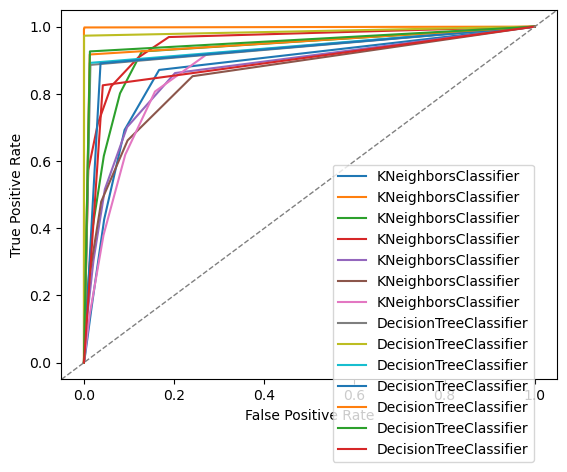

In [17]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

X = newdata[['DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor6', 'DFactor7', 'DFactor8', 
                'DFactor9', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4', 'Area']]
y = newdata['Class']

# Encode the string class labels as integers using LabelEncoder
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Binarize the output
y = label_binarize(y_encoded, classes=range(y_encoded.max() + 1))
n_classes = y.shape[1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

models = [KNeighborsClassifier(), DecisionTreeClassifier()]
pref = {}

def cross_validate(model, X_input, Y_output):
    kf = KFold(n_splits=5, random_state=42, shuffle=True)
    y = np.zeros((X_input.shape[0], n_classes))
    yh = np.zeros((X_input.shape[0], n_classes))
    
    for train_index, test_index in kf.split(X_input):
        model = OneVsRestClassifier(model)
        model.fit(X_input.iloc[train_index], Y_output[train_index])
        y[test_index] = Y_output[test_index]
        yh[test_index] = model.predict_proba(X_input.iloc[test_index])
    
    return y, yh

for model in models:
    model_name = type(model).__name__
    print(model_name)
    label, pred = cross_validate(model, X_train, y_train)
    
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(label[:, i], pred[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    pref[model_name] = {'fpr': fpr, 'tpr': tpr, 'roc_auc': roc_auc}

fig = plt.figure()
i = 0

for model_name, model_pref in pref.items():
    for i in range(n_classes):
        plt.plot(model_pref['fpr'][i], model_pref['tpr'][i], label=model_name)
    
    i += 1

plt.axline((0, 0), (1, 1), linestyle="--", lw=1, color="gray")
plt.legend(loc='upper center', bbox_to_anchor=(0.75, 0.6))
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.savefig('roc_multimethods.png', bbox_inches='tight', dpi=300)

KNeighborsClassifier
RandomForestClassifier


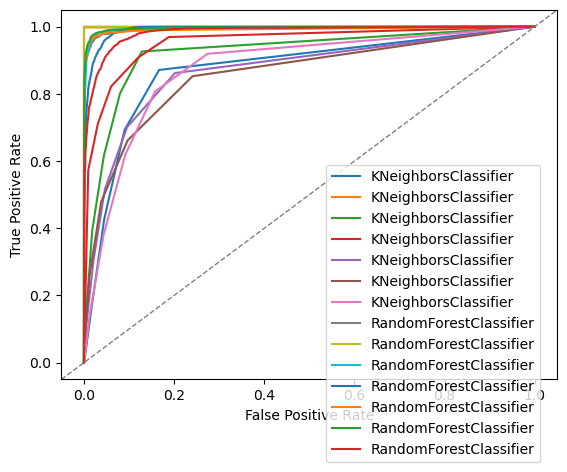

In [18]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

X = newdata[['DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor6', 'DFactor7', 'DFactor8', 
                'DFactor9', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4', 'Area']]
y = newdata['Class']

# Encode the string class labels as integers using LabelEncoder
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Binarize the output
y = label_binarize(y_encoded, classes=range(y_encoded.max() + 1))
n_classes = y.shape[1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

models = [KNeighborsClassifier(), RandomForestClassifier()]
pref = {}

def cross_validate(model, X_input, Y_output):
    kf = KFold(n_splits=5, random_state=42, shuffle=True)
    y = np.zeros((X_input.shape[0], n_classes))
    yh = np.zeros((X_input.shape[0], n_classes))
    
    for train_index, test_index in kf.split(X_input):
        model = OneVsRestClassifier(model)
        model.fit(X_input.iloc[train_index], Y_output[train_index])
        y[test_index] = Y_output[test_index]
        yh[test_index] = model.predict_proba(X_input.iloc[test_index])
    
    return y, yh

for model in models:
    model_name = type(model).__name__
    print(model_name)
    label, pred = cross_validate(model, X_train, y_train)
    
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(label[:, i], pred[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    pref[model_name] = {'fpr': fpr, 'tpr': tpr, 'roc_auc': roc_auc}

fig = plt.figure()
i = 0

for model_name, model_pref in pref.items():
    for i in range(n_classes):
        plt.plot(model_pref['fpr'][i], model_pref['tpr'][i], label=model_name)
    
    i += 1

plt.axline((0, 0), (1, 1), linestyle="--", lw=1, color="gray")
plt.legend(loc='upper center', bbox_to_anchor=(0.75, 0.6))
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.savefig('roc_multimethods.png', bbox_inches='tight', dpi=300)

LogisticRegression
RandomForestClassifier


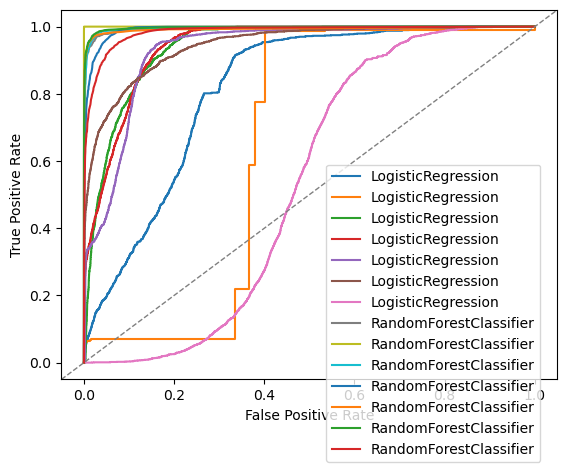

In [19]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

X = newdata[['DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor6', 'DFactor7', 'DFactor8', 
                'DFactor9', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4', 'Area']]
y = newdata['Class']

# Encode the string class labels as integers using LabelEncoder
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Binarize the output
y = label_binarize(y_encoded, classes=range(y_encoded.max() + 1))
n_classes = y.shape[1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

models = [LogisticRegression(), RandomForestClassifier()]
pref = {}

def cross_validate(model, X_input, Y_output):
    kf = KFold(n_splits=5, random_state=42, shuffle=True)
    y = np.zeros((X_input.shape[0], n_classes))
    yh = np.zeros((X_input.shape[0], n_classes))
    
    for train_index, test_index in kf.split(X_input):
        model = OneVsRestClassifier(model)
        model.fit(X_input.iloc[train_index], Y_output[train_index])
        y[test_index] = Y_output[test_index]
        yh[test_index] = model.predict_proba(X_input.iloc[test_index])
    
    return y, yh

for model in models:
    model_name = type(model).__name__
    print(model_name)
    label, pred = cross_validate(model, X_train, y_train)
    
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(label[:, i], pred[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    pref[model_name] = {'fpr': fpr, 'tpr': tpr, 'roc_auc': roc_auc}

fig = plt.figure()
i = 0

for model_name, model_pref in pref.items():
    for i in range(n_classes):
        plt.plot(model_pref['fpr'][i], model_pref['tpr'][i], label=model_name)
    
    i += 1

plt.axline((0, 0), (1, 1), linestyle="--", lw=1, color="gray")
plt.legend(loc='upper center', bbox_to_anchor=(0.75, 0.6))
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.savefig('roc_multimethods.png', bbox_inches='tight', dpi=300)